In [ ]:
import numpy as np
import xarray as xr
import pandas as pd
import cartopy.crs as ccrs
import cartopy.feature as cf
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.path as mpath
import matplotlib.gridspec as gridspec
import matplotlib.colors as colors
# import colorcet as cc
import copy, os
import colormaps as cmaps
import easygems.healpix as egh

In [2]:
rootdir = '/pscratch/sd/w/wcmca1/hackathon/cof_masks/stats/monthly/'
name_map = {
    'obs': 'IMERGv7',
    'm1': 'scream',
    'm2': 'icon_d3hp003',
    'm3': 'casesm2_10km_nocumulus',
}
name_map_plot = {
    'obs': 'OBS',
    'm1': 'SCREAM',
    'm2': 'ICON',
    'm3': 'CASESM2',
}

# Input filenames
filenames = {key:f'{rootdir}{value}_monthly_rainmap_cof_hp8_v1.nc' for key,value in name_map.items()}

landmaskfile = '/global/cfs/cdirs/m4581/gsharing/hackathon/scream-cess-healpix/scream2D_hrly_topo_hp8_v7.zarr'

figdir = '/global/cfs/cdirs/m1867/zfeng/hk25/figures_cof/'
os.makedirs(figdir, exist_ok=True)
print(figdir)

/global/cfs/cdirs/m1867/zfeng/hk25/figures_cof/


### Check if input files exist

In [3]:
for key, value in filenames.items():
    print(f'{value}: {os.path.isfile(value)}')

/pscratch/sd/w/wcmca1/hackathon/cof_masks/stats/monthly/IMERGv7_monthly_rainmap_cof_hp8_v1.nc: True
/pscratch/sd/w/wcmca1/hackathon/cof_masks/stats/monthly/scream_monthly_rainmap_cof_hp8_v1.nc: True
/pscratch/sd/w/wcmca1/hackathon/cof_masks/stats/monthly/icon_d3hp003_monthly_rainmap_cof_hp8_v1.nc: True
/pscratch/sd/w/wcmca1/hackathon/cof_masks/stats/monthly/casesm2_10km_nocumulus_monthly_rainmap_cof_hp8_v1.nc: True


In [4]:
dstop = xr.open_dataset(landmaskfile)
ter = dstop.ELEV
landfrac = dstop.LANDFRAC
dstop

<xarray.Dataset> Size: 13MB
Dimensions:   (cell: 786432, crs: 0)
Coordinates:
  * crs       (crs) float64 0B 
Dimensions without coordinates: cell
Data variables:
    ELEV      (cell) float32 3MB ...
    LANDFRAC  (cell) float32 3MB ...
    lat       (cell) float32 3MB ...
    lon       (cell) float32 3MB ...
Attributes:
    NCO:                        netCDF Operators version 4.9.8-alpha01 (Homep...
    history:                    Fri Jun 11 12:26:48 2021: ncks -A USGS-gtopo3...
    history_of_appended_files:  Fri Jun 11 12:26:48 2021: Appended file USGS-...
    source:                     USGS 30-sec dataset binned to ncube3000 (cube...
    title:                      30-second USGS topo data

<Figure size 640x480 with 0 Axes>

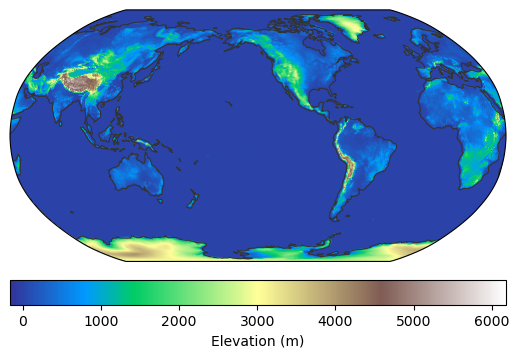

In [5]:
im = egh.healpix_show(ter, cmap='terrain')
plt.colorbar(im, orientation='horizontal', pad=0.05, label='Elevation (m)')

<Figure size 640x480 with 0 Axes>

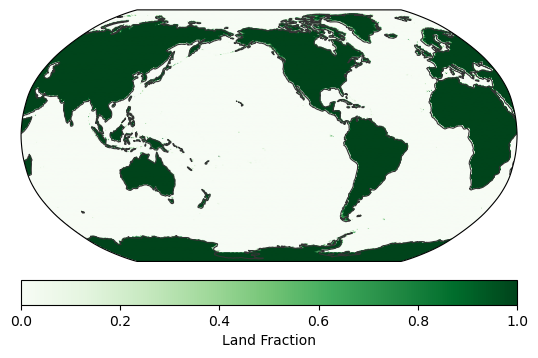

In [6]:
im = egh.healpix_show(landfrac, cmap='Greens', vmin=0, vmax=1)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='Land Fraction')

## Read and combine all sources to a single DataSet

In [7]:
drop_vars = []
# Read all files and combine them with a new dimension 'source'
ds = xr.open_mfdataset(list(filenames.values()), combine='nested', concat_dim='source', drop_variables=drop_vars).squeeze()
# Assign new coordinate 'source' using name_map dictionary keys
ds['source'] = list(name_map.keys())
# ds = ds.pipe(egh.attach_coords)
# Load lat/lon coordinates in memory
hp_lat = ds.lat.load()
hp_lon = ds.lon.load()
ds

<xarray.Dataset> Size: 9GB
Dimensions:                         (source: 4, time: 20, cell: 786432)
Coordinates:
  * time                            (time) datetime64[ns] 160B 2019-08-01 ......
  * cell                            (cell) int32 3MB 0 1 2 ... 786430 786431
    lat                             (cell) float64 6MB 0.1492 0.2984 ... -0.1492
    lon                             (cell) float64 6MB 45.0 45.18 ... 315.0
    crs                             int64 8B 0
  * source                          (source) <U3 48B 'obs' 'm1' 'm2' 'm3'
Data variables: (12/35)
    precipitation                   (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    ntimes                          (source, time) float32 320B dask.array<chunksize=(1, 12), meta=np.ndarray>
    mcs_precipitation               (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    mcs_count                       (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    mcs_precipitation_count         (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    ar_precipitation                (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    ...                              ...
    ar_etc_precipitation            (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    ar_etc_count                    (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    ar_etc_precipitation_count      (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    mcs_ar_etc_precipitation        (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    mcs_ar_etc_count                (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    mcs_ar_etc_precipitation_count  (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
Attributes:
    Title:                    Monthly precipitation statistics by co-occurren...
    contact:                  Zhe Feng, zhe.feng@pnnl.gov
    created_on:               Tue Oct  7 22:39:07 2025
    grid_type:                HEALPix
    zoom_level:               8
    time_interval:            6.0
    precipitation_threshold:  0.1

In [8]:
ds.ntimes.sum(dim='time').values

array([1588., 3137., 1460., 1459.], dtype=float32)

In [101]:
# Get time interval from attributes
time_interval = float(ds.attrs['time_interval'])

# Calculate total hours accounting for time interval
# ntimes is the number of timesteps, multiply by time_interval to get actual hours
ntimes = ds.ntimes.sum(dim='time')
nhours = ntimes * time_interval

# Sum monthly precipitation amount [mm], divided by total hours to get mm/day
tot_pcp_all = (24. * ds.precipitation.sum(dim='time') / nhours).compute()

# Original features
mcs_pcp_all = (24. * ds.mcs_precipitation.sum(dim='time') / nhours).compute()
ar_pcp_all = (24. * ds.ar_precipitation.sum(dim='time') / nhours).compute()
etc_pcp_all = (24. * ds.etc_precipitation.sum(dim='time') / nhours).compute()
tc_pcp_all = (24. * ds.tc_precipitation.sum(dim='time') / nhours).compute()

# Isolated features only
mcs_iso_pcp_all = (24. * ds.mcs_iso_precipitation.sum(dim='time') / nhours).compute()
ar_iso_pcp_all = (24. * ds.ar_iso_precipitation.sum(dim='time') / nhours).compute()
etc_iso_pcp_all = (24. * ds.etc_iso_precipitation.sum(dim='time') / nhours).compute()
# Co-occurrence features
mcs_ar_pcp_all = (24. * ds.mcs_ar_precipitation.sum(dim='time') / nhours).compute()
mcs_etc_pcp_all = (24. * ds.mcs_etc_precipitation.sum(dim='time') / nhours).compute()
ar_etc_pcp_all = (24. * ds.ar_etc_precipitation.sum(dim='time') / nhours).compute()
mcs_ar_etc_pcp_all = (24. * ds.mcs_ar_etc_precipitation.sum(dim='time') / nhours).compute()

# Calculate precipitation fractions
# Original features
mcs_pcpfrac_all = 100. * mcs_pcp_all / tot_pcp_all
tc_pcpfrac_all = 100. * tc_pcp_all / tot_pcp_all

# Isolated features only
mcs_iso_pcpfrac_all = 100. * mcs_iso_pcp_all / tot_pcp_all
ar_iso_pcpfrac_all = 100. * ar_iso_pcp_all / tot_pcp_all
tc_pcpfrac_all = 100. * tc_pcp_all / tot_pcp_all
etc_iso_pcpfrac_all = 100. * etc_iso_pcp_all / tot_pcp_all
# Co-occurrence features
mcs_ar_pcpfrac_all = 100. * mcs_ar_pcp_all / tot_pcp_all
mcs_etc_pcpfrac_all = 100. * mcs_etc_pcp_all / tot_pcp_all
ar_etc_pcpfrac_all = 100. * ar_etc_pcp_all / tot_pcp_all
mcs_ar_etc_pcpfrac_all = 100. * mcs_ar_etc_pcp_all / tot_pcp_all

In [10]:
# mcs_pcp_sumcof_all = mcs_iso_pcp_all + mcs_ar_pcp_all + mcs_etc_pcp_all + mcs_ar_etc_pcp_all
# mcs_pcp_diff = mcs_pcp_sumcof_all - mcs_pcp_all

In [11]:
# im = egh.healpix_show(mcs_pcp_diff.sel(source='obs'), vmin=-4, vmax=4, cmap='BrBG')
# plt.colorbar(im, orientation='horizontal', pad=0.05, label='$\Delta$MCS Precipitation (mm/day)')

In [43]:
# Calculate number of feature mask hours
# Original features
mcs_count_all = ds.mcs_count.sum(dim='time').compute()
ar_count_all = ds.ar_count.sum(dim='time').compute()
etc_count_all = ds.etc_count.sum(dim='time').compute()
tc_count_all = ds.tc_count.sum(dim='time').compute()

# Isolated features only
mcs_iso_count_all = ds.mcs_iso_count.sum(dim='time').compute()
ar_iso_count_all = ds.ar_iso_count.sum(dim='time').compute()
etc_iso_count_all = ds.etc_iso_count.sum(dim='time').compute()
# Co-occurrence features
mcs_ar_count_all = ds.mcs_ar_count.sum(dim='time').compute()
mcs_etc_count_all = ds.mcs_etc_count.sum(dim='time').compute()
ar_etc_count_all = ds.ar_etc_count.sum(dim='time').compute()
mcs_ar_etc_count_all = ds.mcs_ar_etc_count.sum(dim='time').compute()

# Calculate feature mask frequencies (as percentages)
# Original features
mcs_freq_all = 100. * mcs_count_all / nhours
ar_freq_all = 100. * ar_count_all / nhours
etc_freq_all = 100. * etc_count_all / nhours
tc_freq_all = 100. * tc_count_all / nhours

# Isolated features only
mcs_iso_freq_all = 100. * mcs_iso_count_all / nhours
ar_iso_freq_all = 100. * ar_iso_count_all / nhours
etc_iso_freq_all = 100. * etc_iso_count_all / nhours
# Co-occurrence features
mcs_ar_freq_all = 100. * mcs_ar_count_all / nhours
mcs_etc_freq_all = 100. * mcs_etc_count_all / nhours
ar_etc_freq_all = 100. * ar_etc_count_all / nhours
mcs_ar_etc_freq_all = 100. * mcs_ar_etc_count_all / nhours

In [ ]:
# mcs_all_freq_all = 100 * (mcs_iso_count_all + mcs_ar_count_all + mcs_etc_count_all + mcs_ar_etc_count_all) / nhours


In [44]:
# Number of feature precipitation hours
# Original features
mcs_pcpcount_all = ds.mcs_precipitation_count.sum(dim='time').compute()
ar_pcpcount_all = ds.ar_precipitation_count.sum(dim='time').compute()
etc_pcpcount_all = ds.etc_precipitation_count.sum(dim='time').compute()
tc_pcpcount_all = ds.tc_precipitation_count.sum(dim='time').compute()

# Isolated features only
mcs_iso_pcpcount_all = ds.mcs_precipitation_count.sum(dim='time').compute()
ar_iso_pcpcount_all = ds.ar_precipitation_count.sum(dim='time').compute()
etc_iso_pcpcount_all = ds.etc_precipitation_count.sum(dim='time').compute()
# Co-occurrence features
mcs_ar_pcpcount_all = ds.mcs_ar_precipitation_count.sum(dim='time').compute()
mcs_etc_pcpcount_all = ds.mcs_etc_precipitation_count.sum(dim='time').compute()
ar_etc_pcpcount_all = ds.ar_etc_precipitation_count.sum(dim='time').compute()
mcs_ar_etc_pcpcount_all = ds.mcs_ar_etc_precipitation_count.sum(dim='time').compute()

# Calculate feature frequencies (as percentages)
# Original features
mcs_pcpfreq_all = 100 * mcs_pcpcount_all / ntimes
ar_pcpfreq_all = 100 * ar_pcpcount_all / ntimes
etc_pcpfreq_all = 100 * etc_pcpcount_all / ntimes
tc_pcpfreq_all = 100 * tc_pcpcount_all / ntimes

# Isolated features only
mcs_iso_pcpfreq_all = 100 * mcs_iso_pcpcount_all / ntimes
ar_iso_pcpfreq_all = 100 * ar_iso_pcpcount_all / ntimes
etc_iso_pcpfreq_all = 100 * etc_iso_pcpcount_all / ntimes
# Co-occurrence features
mcs_ar_pcpfreq_all = 100 * mcs_ar_pcpcount_all / ntimes
mcs_etc_pcpfreq_all = 100 * mcs_etc_pcpcount_all / ntimes
ar_etc_pcpfreq_all = 100 * ar_etc_pcpcount_all / ntimes
mcs_ar_etc_pcpfreq_all = 100 * mcs_ar_etc_pcpcount_all / ntimes

<Figure size 640x480 with 0 Axes>

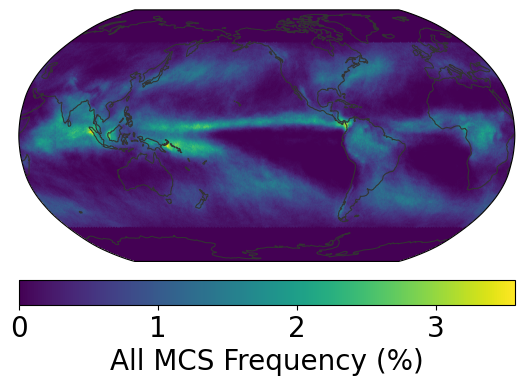

In [45]:
im = egh.healpix_show(mcs_freq_all.sel(source='obs'))
plt.colorbar(im, orientation='horizontal', pad=0.05, label='All MCS Frequency (%)')

<Figure size 640x480 with 0 Axes>

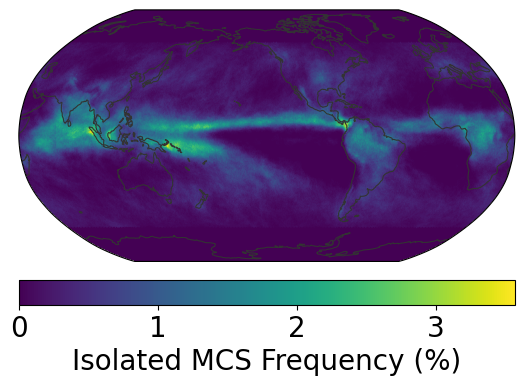

In [46]:
im = egh.healpix_show(mcs_iso_freq_all.sel(source='obs'))
plt.colorbar(im, orientation='horizontal', pad=0.05, label='Isolated MCS Frequency (%)')

<Figure size 640x480 with 0 Axes>

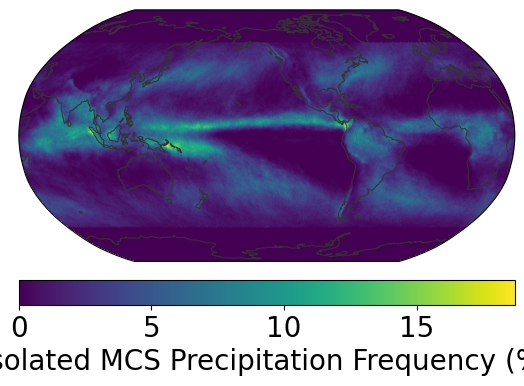

In [47]:
im = egh.healpix_show(mcs_iso_pcpfreq_all.sel(source='obs'))
plt.colorbar(im, orientation='horizontal', pad=0.05, label='Isolated MCS Precipitation Frequency (%)')

<Figure size 640x480 with 0 Axes>

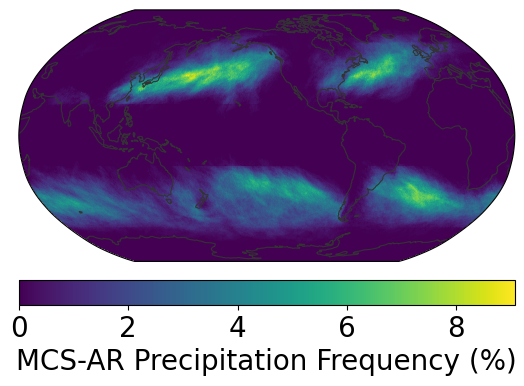

In [48]:
im = egh.healpix_show(mcs_ar_pcpfreq_all.sel(source='obs'))
plt.colorbar(im, orientation='horizontal', pad=0.05, label='MCS-AR Precipitation Frequency (%)')

<Figure size 640x480 with 0 Axes>

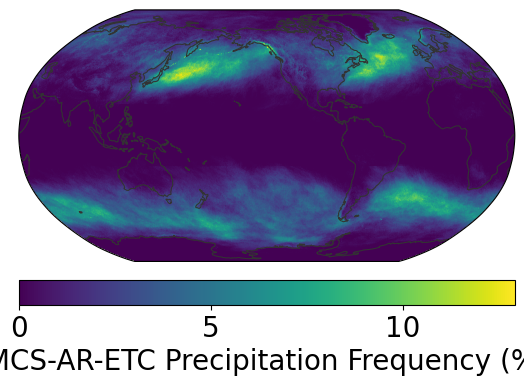

In [49]:
im = egh.healpix_show(mcs_ar_etc_pcpfreq_all.sel(source='obs'))
plt.colorbar(im, orientation='horizontal', pad=0.05, label='MCS-AR-ETC Precipitation Frequency (%)')

<Figure size 640x480 with 0 Axes>

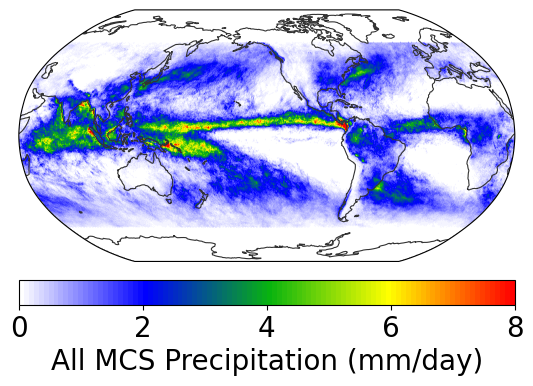

In [50]:
im = egh.healpix_show(mcs_pcp_all.sel(source='obs'), vmin=0, vmax=8, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='All MCS Precipitation (mm/day)')

<Figure size 640x480 with 0 Axes>

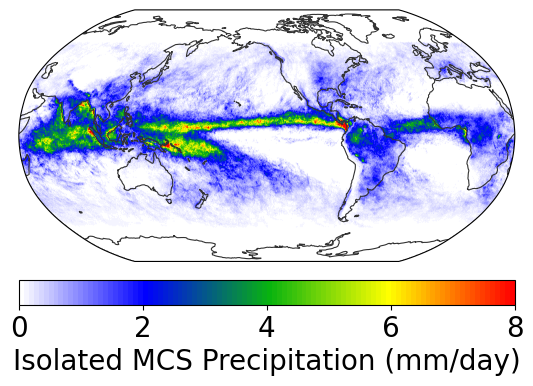

In [51]:
im = egh.healpix_show(mcs_iso_pcp_all.sel(source='obs'), vmin=0, vmax=8, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='Isolated MCS Precipitation (mm/day)')

<Figure size 640x480 with 0 Axes>

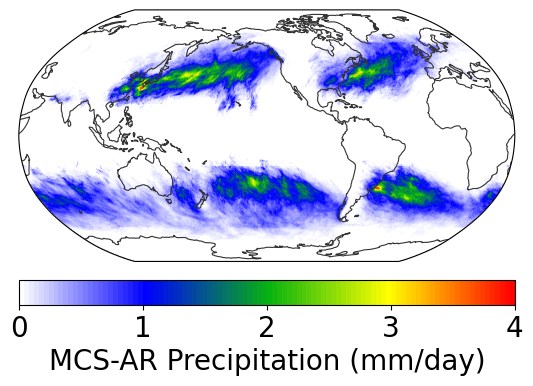

In [52]:
im = egh.healpix_show(mcs_ar_pcp_all.sel(source='obs'), vmin=0, vmax=4, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='MCS-AR Precipitation (mm/day)')

<Figure size 640x480 with 0 Axes>

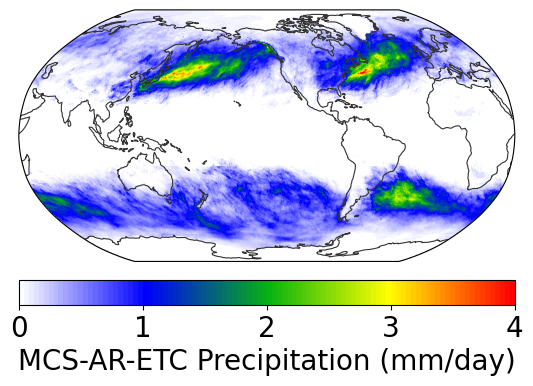

In [53]:
im = egh.healpix_show(mcs_ar_etc_pcp_all.sel(source='obs'), vmin=0, vmax=4, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='MCS-AR-ETC Precipitation (mm/day)')

## Filter data by latitude bands

In [108]:
tropics_lat = [-20, 20]
# extratropics_lat = [-90, -20, 20, 90]
tc_lat = [-40, 40]

tot_pcp_all_trop = tot_pcp_all.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
tot_pcp_all_extrop = tot_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

# Filter features for different latitude bands
# Original features
mcs_freq_all_trop = mcs_freq_all.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
mcs_pcp_all_trop = mcs_pcp_all.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
mcs_pcp_all_extrop = mcs_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

tc_freq_all_trop = tc_freq_all.where((hp_lat >= min(tc_lat)) & (hp_lat <= max(tc_lat)))
tc_pcp_all_trop = tc_pcp_all.where((hp_lat >= min(tc_lat)) & (hp_lat <= max(tc_lat)))

# Isolated features only
mcs_iso_freq_all_trop = mcs_iso_freq_all.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
mcs_iso_pcp_all_trop = mcs_iso_pcp_all.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
mcs_iso_pcp_all_extrop = mcs_iso_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

ar_iso_freq_all_extrop = ar_iso_freq_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
ar_iso_pcp_all_extrop = ar_iso_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

etc_iso_freq_all_extrop = etc_iso_freq_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
etc_iso_pcp_all_extrop = etc_iso_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

# Co-occurrence features
mcs_ar_freq_all_extrop = mcs_ar_freq_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
mcs_ar_pcp_all_extrop = mcs_ar_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

mcs_etc_freq_all_extrop = mcs_etc_freq_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
mcs_etc_pcp_all_extrop = mcs_etc_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

ar_etc_freq_all_extrop = ar_etc_freq_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
ar_etc_pcp_all_extrop = ar_etc_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

mcs_ar_etc_freq_all_extrop = mcs_ar_etc_freq_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
mcs_ar_etc_pcp_all_extrop = mcs_ar_etc_pcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

<Figure size 640x480 with 0 Axes>

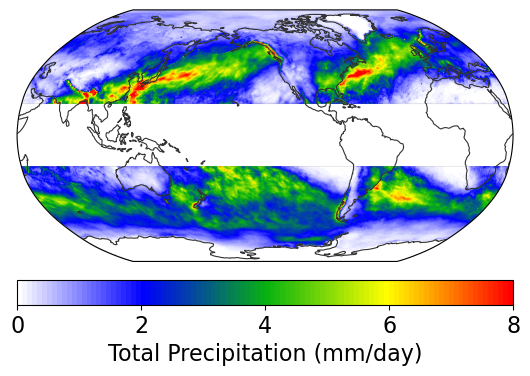

In [103]:
# im = egh.healpix_show(tot_pcp_all_trop.sel(source='obs'), vmin=0, vmax=12, cmap=cmaps.WhBlGrYeRe)
im = egh.healpix_show(tot_pcp_all_extrop.sel(source='obs'), vmin=0, vmax=8, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='Total Precipitation (mm/day)')

<Figure size 640x480 with 0 Axes>

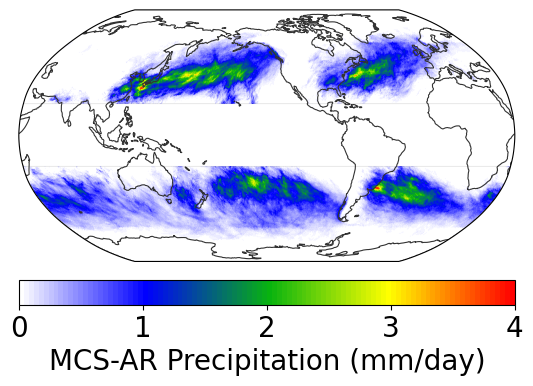

In [56]:
im = egh.healpix_show(mcs_ar_pcp_all_extrop.sel(source='obs'), vmin=0, vmax=4, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='MCS-AR Precipitation (mm/day)')

<Figure size 640x480 with 0 Axes>

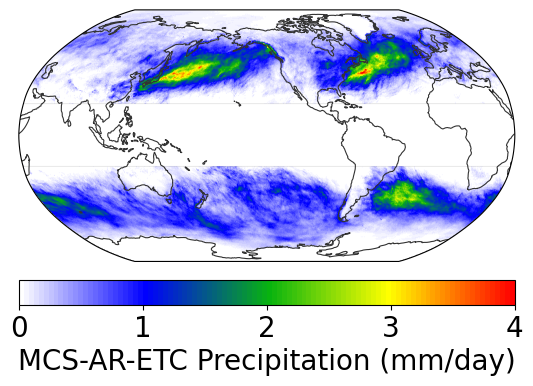

In [57]:
im = egh.healpix_show(mcs_ar_etc_pcp_all_extrop.sel(source='obs'), vmin=0, vmax=4, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='MCS-AR-ETC Precipitation (mm/day)')

In [113]:
# Compute global mean values
# Original features
mcs_freq_all_trop_avg = mcs_freq_all_trop.mean(dim='cell').compute()
mcs_pcp_all_avg = mcs_pcp_all.mean(dim='cell').compute()
mcs_pcp_all_trop_avg = mcs_pcp_all_trop.mean(dim='cell').compute()
mcs_pcp_all_extrop_avg = mcs_pcp_all_extrop.mean(dim='cell').compute()

tc_freq_all_trop_avg = tc_freq_all_trop.mean(dim='cell').compute()
tc_pcp_all_trop_avg = tc_pcp_all_trop.mean(dim='cell').compute()

# Isolated features only
mcs_iso_freq_all_trop_avg = mcs_iso_freq_all_trop.mean(dim='cell').compute()
mcs_iso_pcp_all_trop_avg = mcs_iso_pcp_all_trop.mean(dim='cell').compute()
mcs_iso_pcp_all_extrop_avg = mcs_iso_pcp_all_extrop.mean(dim='cell').compute()

ar_iso_freq_all_extrop_avg = ar_iso_freq_all_extrop.mean(dim='cell').compute()
ar_iso_pcp_all_extrop_avg = ar_iso_pcp_all_extrop.mean(dim='cell').compute()

etc_iso_freq_all_extrop_avg = etc_iso_freq_all_extrop.mean(dim='cell').compute()
etc_iso_pcp_all_extrop_avg = etc_iso_pcp_all_extrop.mean(dim='cell').compute()

# Co-occurrence features
mcs_ar_freq_all_extrop_avg = mcs_ar_freq_all_extrop.mean(dim='cell').compute()
mcs_ar_pcp_all_extrop_avg = mcs_ar_pcp_all_extrop.mean(dim='cell').compute()

mcs_etc_freq_all_extrop_avg = mcs_etc_freq_all_extrop.mean(dim='cell').compute()
mcs_etc_pcp_all_extrop_avg = mcs_etc_pcp_all_extrop.mean(dim='cell').compute()

ar_etc_freq_all_extrop_avg = ar_etc_freq_all_extrop.mean(dim='cell').compute()
ar_etc_pcp_all_extrop_avg = ar_etc_pcp_all_extrop.mean(dim='cell').compute()

mcs_ar_etc_freq_all_extrop_avg = mcs_ar_etc_freq_all_extrop.mean(dim='cell').compute()
mcs_ar_etc_pcp_all_extrop_avg = mcs_ar_etc_pcp_all_extrop.mean(dim='cell').compute()

In [111]:
# All MCS precipitation fractions
mcs_pcpfrac_all_avg = 100 * (mcs_pcp_all.sum(dim='cell') / tot_pcp_all.sum(dim='cell')).compute()
mcs_pcpfrac_all_trop_avg = 100 * (mcs_pcp_all_trop.sum(dim='cell') / tot_pcp_all_trop.sum(dim='cell')).compute()
mcs_pcpfrac_all_extrop_avg = 100 * (mcs_pcp_all_extrop.sum(dim='cell') / tot_pcp_all_extrop.sum(dim='cell')).compute()

# Extratropics isolated & co-occurring MCS precipitation fractions
mcs_iso_pcpfrac_all_extrop_avg = 100 * (mcs_iso_pcp_all_extrop.sum(dim='cell') / tot_pcp_all_extrop.sum(dim='cell')).compute()
mcs_ar_pcpfrac_all_extrop_avg = 100 * (mcs_ar_pcp_all_extrop.sum(dim='cell') / tot_pcp_all_extrop.sum(dim='cell')).compute()
mcs_etc_pcpfrac_all_extrop_avg = 100 * (mcs_etc_pcp_all_extrop.sum(dim='cell') / tot_pcp_all_extrop.sum(dim='cell')).compute()
mcs_ar_etc_pcpfrac_all_extrop_avg = 100 * (mcs_ar_etc_pcp_all_extrop.sum(dim='cell') / tot_pcp_all_extrop.sum(dim='cell')).compute()

ar_etc_pcpfrac_all_extrop_avg = 100 * (ar_etc_pcp_all_extrop.sum(dim='cell') / tot_pcp_all_extrop.sum(dim='cell')).compute()

## Function to make bar plots

In [112]:
def plot_feature_comparison(feature_data, plot_type='value', figsize=(12, 8), fontsize=18, 
                            features=None, xlabel=None, ylabel=None, title=None, ylims=None,
                           figname=None, show_plot=True):
    """
    Plot bar chart for feature comparison or model bias.
    
    Parameters:
    -----------
    feature_data : list
        List of arrays containing feature data [mcs, ar, etc, tc]
    plot_type : str
        'value' for actual values or 'bias' for relative differences
    figsize : tuple
        Figure size (width, height)
    fontsize : int
        Base font size for the plot
    features : list
        List of feature names corresponding to feature_data
    ylims : tuple or None
        Y-axis limits (ymin, ymax). If provided, bar values exceeding limits 
        will have their labels placed within the plot area
    figname : str
        figname for saving (optional)
    show_plot : bool
        Whether to display the plot
    
    Returns:
    --------
    fig, ax : matplotlib figure and axes objects
    """
    
    # Set up the plot
    fig, ax = plt.subplots(figsize=figsize)
    mpl.rcParams['font.size'] = fontsize
    
    # Get source information
    sources = feature_data[0].source.values  # Assuming all have same sources
    # features = ['MCS', 'AR', 'ETC', 'TC']
    
    if plot_type == 'value':
        # Plot actual values
        source_labels = [name_map_plot[src] for src in sources]
        # Colors for each source
        colors = ['k', 'dodgerblue', 'deeppink', 'darkorange']
        
        # Extract values for each feature
        values_data = [data.values for data in feature_data]
        
        # Set up bar positions
        x = np.arange(len(features))
        width = 0.2
        
        # Create bars for each source
        for i, (source_label, color) in enumerate(zip(source_labels, colors)):
            values = [data[i] for data in values_data]
            bars = ax.bar(x + i * width, values, width, label=source_label, 
                         color=color, alpha=0.8)
            
            # Add value labels on top of bars
            for bar, value in zip(bars, values):
                height = bar.get_height()
                # Check if ylims is provided and if bar exceeds limits
                if ylims is not None and height > ylims[1]:
                    # Place label within plot area for bars exceeding upper limit
                    text_y = ylims[1] - (ylims[1] - ylims[0]) * 0.1  # 10% from top
                    va = 'top'
                else:
                    # Standard placement above bar - scale offset with ylims if provided
                    if ylims is not None:
                        offset = (ylims[1] - ylims[0]) * 0.02  # 2% of y-range
                    else:
                        offset = 0.05  # Fixed offset when no ylims
                    text_y = height + offset
                    va = 'bottom'
                
                ax.text(bar.get_x() + bar.get_width()/2., text_y,
                        f'{value:.2f}', ha='center', va=va, fontsize=fontsize*0.7)
        
        # Customize plot
        ax.set_ylabel(ylabel, fontsize=fontsize, fontweight='bold')
        ax.set_title(title, fontsize=fontsize, fontweight='bold', pad=20)
        ax.set_xticks(x + width * 1.5)
        ax.legend(title='', loc='best', fontsize=fontsize*0.8)
                
    elif plot_type == 'bias':
        # Plot relative differences (model - obs)/obs
        model_sources = [src for src in sources if src != 'obs']
        model_labels = [name_map_plot[src] for src in model_sources]
        # Colors for each model
        colors = ['dodgerblue', 'deeppink', 'darkorange']
        
        # Get obs values (index 0 corresponds to 'obs')
        obs_idx = list(sources).index('obs')
        obs_values = [data.values[obs_idx] for data in feature_data]
        
        # Calculate relative differences: (model - obs)/obs * 100
        relative_diffs = []
        for feature_idx in range(len(features)):
            feature_diffs = []
            for model_src in model_sources:
                model_data_idx = list(sources).index(model_src)
                model_val = feature_data[feature_idx].values[model_data_idx]
                obs_val = obs_values[feature_idx]
                rel_diff = (model_val - obs_val) / obs_val * 100
                feature_diffs.append(rel_diff)
            relative_diffs.append(feature_diffs)
        
        # Set up bar positions
        x = np.arange(len(features))
        width = 0.25
        
        # Create bars for each model
        for i, (model_label, color) in enumerate(zip(model_labels, colors)):
            values = [diff[i] for diff in relative_diffs]
            bars = ax.bar(x + i * width, values, width, label=model_label, 
                         color=color, alpha=0.8)
            
            # Add value labels on top of bars
            for bar, value in zip(bars, values):
                height = bar.get_height()
                # Check if ylims is provided and if bar exceeds limits
                if ylims is not None:
                    if height > ylims[1]:
                        # Place label within plot area for bars exceeding upper limit
                        text_y = ylims[1] - (ylims[1] - ylims[0]) * 0.05  # 5% from top
                        va = 'top'
                    elif height < ylims[0]:
                        # Place label within plot area for bars exceeding lower limit
                        text_y = ylims[0] + (ylims[1] - ylims[0]) * 0.05  # 5% from bottom
                        va = 'bottom'
                    else:
                        # Standard placement relative to bar - scale offset with ylims
                        offset = (ylims[1] - ylims[0]) * 0.02  # 2% of y-range
                        va = 'bottom' if height >= 0 else 'top'
                        text_y = height + (offset if height >= 0 else -offset)
                else:
                    # Standard placement relative to bar - use fraction of auto y-range when no ylims
                    va = 'bottom' if height >= 0 else 'top'
                    # Calculate auto y-range for relative offset
                    y_min_auto = min([min(diff) for diff in relative_diffs]) - 10
                    y_max_auto = max([max(diff) for diff in relative_diffs]) + 10
                    offset = (y_max_auto - y_min_auto) * 0.02  # 2% of auto y-range
                    text_y = height + (offset if height >= 0 else -offset)
                
                ax.text(bar.get_x() + bar.get_width()/2., text_y,
                        f'{int(round(value))}%', ha='center', va=va, fontsize=fontsize*0.7)
        
        # Add horizontal line at y=0 for reference
        ax.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=0.8)
        
        # Customize plot
        ax.set_ylabel(ylabel, fontsize=fontsize, fontweight='bold')
        ax.set_title(title, fontsize=fontsize, fontweight='bold', pad=20)
        ax.set_xticks(x + width)
        ax.legend(title='', loc='best', fontsize=fontsize*0.8)
        
        # Set y-axis limits to accommodate all values with some padding
        y_min = min([min(diff) for diff in relative_diffs]) - 10
        y_max = max([max(diff) for diff in relative_diffs]) + 10
        ax.set_ylim(y_min, y_max)
            
    else:
        raise ValueError("plot_type must be either 'frequency' or 'bias'")
    
    # Common plot settings
    ax.set_xticklabels(features)
    ax.grid(True, alpha=0.3, axis='y')
    
    # Set y-axis limits if provided
    if ylims is not None:
        ax.set_ylim(ylims)
    
    plt.tight_layout()
    
    # Save figure if directory is provided
    if figname:
        plt.savefig(figname, dpi=300, bbox_inches='tight')
        print(f'Figure saved: {figname}')
    
    # Show plot if requested
    if show_plot:
        plt.show()
    
    return fig, ax

<>:26: SyntaxWarning: invalid escape sequence '\D'
<>:26: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_770014/751030322.py:26: SyntaxWarning: invalid escape sequence '\D'
  ylabel = '$\Delta$Frequency [Model - Obs] (%)'


Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_cof/cof_frequency_comparison_barplot.png


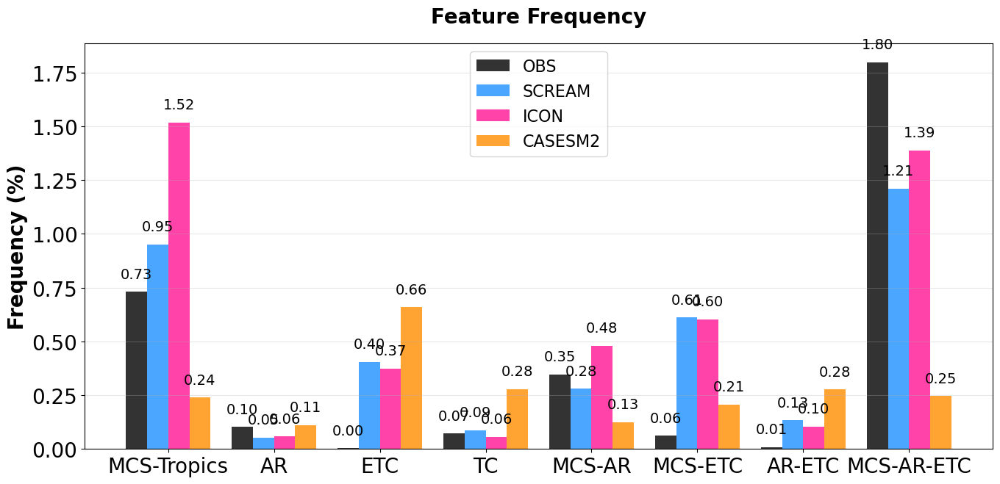

Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_cof/cof_frequency_model_bias_barplot.png


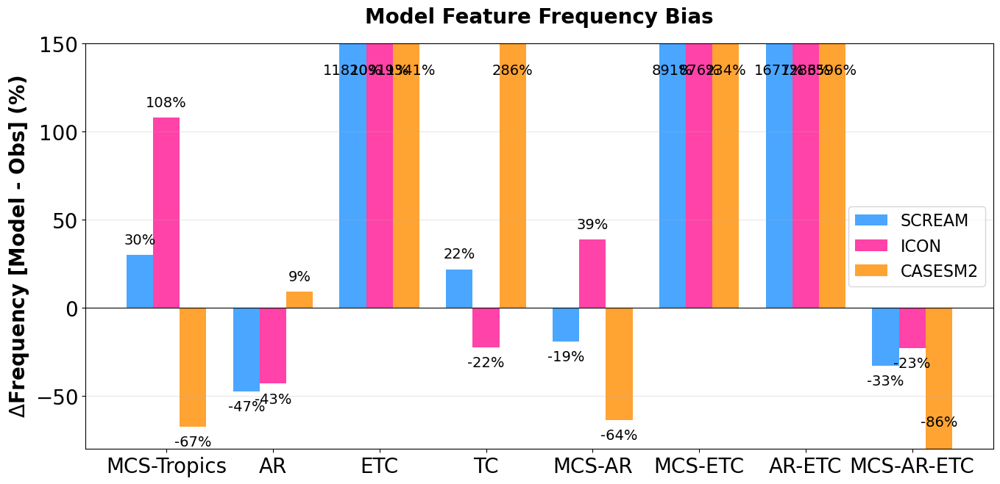

In [60]:
# Prepare feature data
feature_data = [
    mcs_freq_all_trop_avg,
    ar_iso_freq_all_extrop_avg,
    etc_iso_freq_all_extrop_avg,
    tc_freq_all_trop_avg,
    mcs_ar_freq_all_extrop_avg,
    mcs_etc_freq_all_extrop_avg,
    ar_etc_freq_all_extrop_avg,
    mcs_ar_etc_freq_all_extrop_avg,
]
features = ['MCS-Tropics', 'AR', 'ETC', 'TC', 'MCS-AR', 'MCS-ETC', 'AR-ETC', 'MCS-AR-ETC']
figsize = (14, 7)
fontsize = 20

# Plot actual frequency values
ylims = None
ylabel = 'Frequency (%)'
title = 'Feature Frequency'
figname = f'{figdir}cof_frequency_comparison_barplot.png'
fig1, ax1 = plot_feature_comparison(feature_data, plot_type='value', features=features, 
    ylabel=ylabel, ylims=ylims, title=title, figsize=figsize, fontsize=fontsize, figname=figname, show_plot=True)

# Plot model bias (relative differences)
ylims = (-80, 150)
ylabel = '$\Delta$Frequency [Model - Obs] (%)'
title = 'Model Feature Frequency Bias'
figname = f'{figdir}cof_frequency_model_bias_barplot.png'
fig2, ax2 = plot_feature_comparison(feature_data, plot_type='bias', features=features, 
    ylabel=ylabel, ylims=ylims, title=title, figsize=figsize, fontsize=fontsize, figname=figname, show_plot=True)

<>:25: SyntaxWarning: invalid escape sequence '\D'
<>:25: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_770014/4124715743.py:25: SyntaxWarning: invalid escape sequence '\D'
  ylabel = '$\Delta$Precipitation [Model - Obs] (%)'


Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_cof/cof_precipitation_comparison_barplot.png


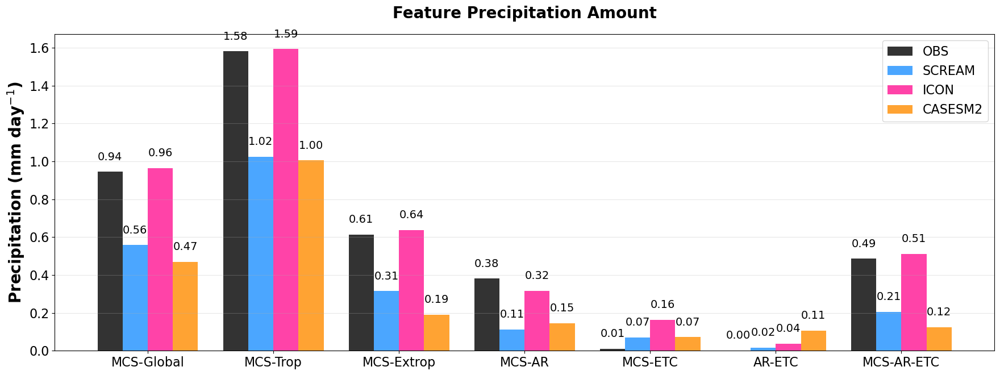

Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_cof/cof_precipitation_model_bias_barplot.png


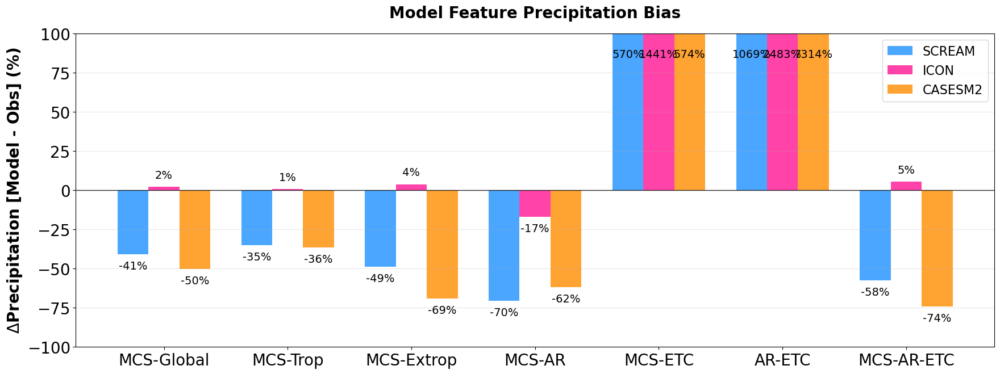

In [114]:
# Prepare feature data
feature_data = [
    mcs_pcp_all_avg,
    mcs_pcp_all_trop_avg,
    mcs_pcp_all_extrop_avg,
    mcs_ar_pcp_all_extrop_avg,
    mcs_etc_pcp_all_extrop_avg,
    ar_etc_pcp_all_extrop_avg,
    mcs_ar_etc_pcp_all_extrop_avg,
]
features = ['MCS-Global', 'MCS-Trop', 'MCS-Extrop', 'MCS-AR', 'MCS-ETC', 'AR-ETC', 'MCS-AR-ETC']
figsize = (18, 7)
fontsize = 20

# Plot actual frequency values
ylims = None
ylabel = 'Precipitation (mm day$^{-1}$)'
title = 'Feature Precipitation Amount'
figname = f'{figdir}cof_precipitation_comparison_barplot.png'
fig1, ax1 = plot_feature_comparison(feature_data, plot_type='value', features=features, 
    ylabel=ylabel, ylims=ylims, title=title, figsize=figsize, fontsize=fontsize, figname=figname, show_plot=True)

# Plot model bias (relative differences)
ylims = (-100, 100)
ylabel = '$\Delta$Precipitation [Model - Obs] (%)'
title = 'Model Feature Precipitation Bias'
figname = f'{figdir}cof_precipitation_model_bias_barplot.png'
fig2, ax2 = plot_feature_comparison(feature_data, plot_type='bias', features=features, 
    ylabel=ylabel, ylims=ylims, title=title, figsize=figsize, fontsize=fontsize, figname=figname, show_plot=True)

<>:25: SyntaxWarning: invalid escape sequence '\D'
<>:25: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_770014/1231952826.py:25: SyntaxWarning: invalid escape sequence '\D'
  ylabel = '$\Delta$Fraction [Model - Obs] (%)'


Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_cof/cof_precipitationfrac_comparison_barplot.png


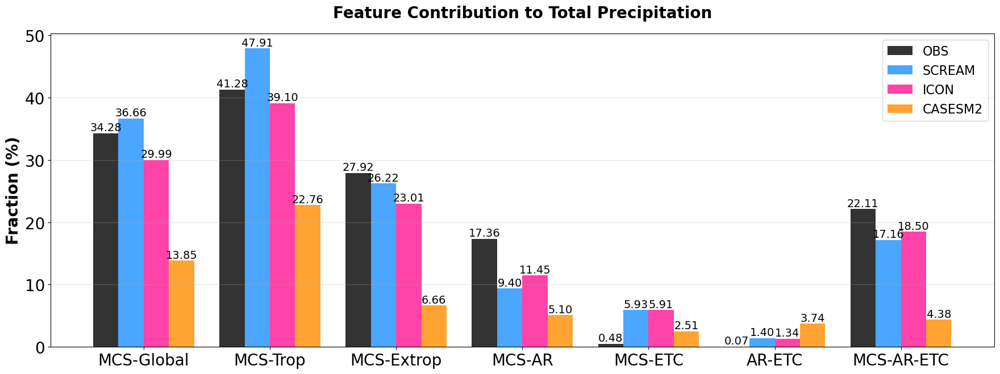

Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures_cof/cof_precipitationfrac_model_bias_barplot.png


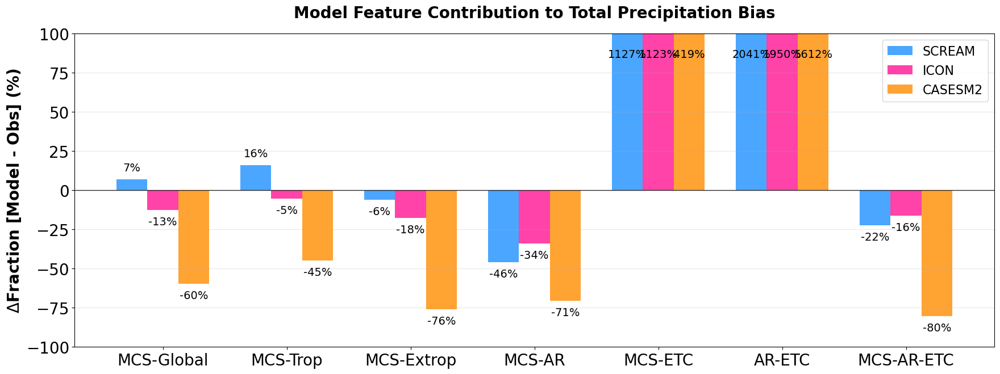

In [115]:
# Prepare feature data
feature_data = [
    mcs_pcpfrac_all_avg,
    mcs_pcpfrac_all_trop_avg,
    mcs_pcpfrac_all_extrop_avg,
    mcs_ar_pcpfrac_all_extrop_avg,
    mcs_etc_pcpfrac_all_extrop_avg,
    ar_etc_pcpfrac_all_extrop_avg,
    mcs_ar_etc_pcpfrac_all_extrop_avg,
]
features = ['MCS-Global', 'MCS-Trop', 'MCS-Extrop', 'MCS-AR', 'MCS-ETC', 'AR-ETC', 'MCS-AR-ETC']
figsize = (18, 7)
fontsize = 20

# Plot actual frequency values
ylims = None
ylabel = 'Fraction (%)'
title = 'Feature Contribution to Total Precipitation'
figname = f'{figdir}cof_precipitationfrac_comparison_barplot.png'
fig1, ax1 = plot_feature_comparison(feature_data, plot_type='value', features=features, 
    ylabel=ylabel, ylims=ylims, title=title, figsize=figsize, fontsize=fontsize, figname=figname, show_plot=True)

# Plot model bias (relative differences)
ylims = (-100, 100)
ylabel = '$\Delta$Fraction [Model - Obs] (%)'
title = 'Model Feature Contribution to Total Precipitation Bias'
figname = f'{figdir}cof_precipitationfrac_model_bias_barplot.png'
fig2, ax2 = plot_feature_comparison(feature_data, plot_type='bias', features=features, 
    ylabel=ylabel, ylims=ylims, title=title, figsize=figsize, fontsize=fontsize, figname=figname, show_plot=True)

## Function to plot multiple maps

In [62]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=256):
    """
    Truncate colormap.
    """
    new_cmap = mpl.colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

In [63]:
def plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname, 
                  min_thresh=None, wspace=None, hspace=None, oob_colors=None, 
                  contourf=False, figsize=None, fontsize=None, cb_fontsize=None, 
                  show_cb2=False, figtitle=None, dpi=200, lat_lines=None):
    """
    Plot a grid of maps with flexible dimensions
    
    Parameters:
    -----------
    da_list : list of lists
        2D list of xarray DataArrays to plot, dimensions should be [nrow][ncol]
    titles : list of lists
        2D list of titles for each panel, dimensions should be [nrow][ncol]
    levels, colormaps, etc.: can be single values applied to all panels or lists of lists matching da_list
    lat_lines : list or None
        List of latitude values to plot as horizontal lines (e.g., [-20, 20] for tropics)
    """
    # Get grid dimensions from input data
    nrow = len(da_list)
    ncol = len(da_list[0]) if nrow > 0 else 0
    
    # Handle case where parameters might be the same for all panels
    def ensure_grid_format(param, param_name):
        if not isinstance(param, list):
            # If single value provided, apply to all panels
            return [[param for _ in range(ncol)] for _ in range(nrow)]
        elif isinstance(param, list):
            if len(param) == 0:
                # Empty list
                return [[[] for _ in range(ncol)] for _ in range(nrow)]
            elif isinstance(param[0], list):
                # Already a list of lists, return as is
                return param
            else:
                # It's a 1D list (like levels=[1,2,3,5,7,10]), use same list for all panels
                return [[param for _ in range(ncol)] for _ in range(nrow)]
        return param
    
    # Ensure all parameters have proper grid format
    colormaps = ensure_grid_format(colormaps, "colormaps")
    levels = ensure_grid_format(levels, "levels")
    cbticks = ensure_grid_format(cbticks, "cbticks")
    
    mpl.rcParams['font.size'] = fontsize
    map_extent = [0, 360, -60, 60]
    proj = ccrs.Robinson(central_longitude=225)
    data_proj = ccrs.PlateCarree()
    resolution = '110m'
    land = cf.NaturalEarthFeature('physical', 'land', resolution)
    ocean = cf.NaturalEarthFeature('physical', 'ocean', resolution)
    borders = cf.NaturalEarthFeature('cultural', 'admin_0_boundary_lines_land', resolution)

    fig = plt.figure(figsize=figsize, dpi=100)
    # Setup two columns (left: plots, right: colorbar)
    gs0 = gridspec.GridSpec(1, 2, figure=fig, height_ratios=[1], width_ratios=[1,0.02], wspace=0.05)
    # Setup panels to the left
    h_ratios = list(np.repeat(1, nrow))
    w_ratios = list(np.repeat(1, ncol))
    gs = gridspec.GridSpecFromSubplotSpec(nrow, ncol, subplot_spec=gs0[0], 
                                         height_ratios=h_ratios, width_ratios=w_ratios, 
                                         wspace=wspace, hspace=hspace)
    
    # Loop over each panel in the grid
    cf1 = None  # Will store the last plot for colorbar
    for row in range(nrow):
        for col in range(ncol):
            # Get panel index
            panel_idx = row * ncol + col
            
            # Create subplot
            ax = plt.subplot(gs[panel_idx], projection=proj)
            ax.set_global()
            ax.add_feature(land, facecolor='none', edgecolor='k', zorder=3)
            ax.set_aspect('auto', adjustable=None)
            
            # Add title
            flabel = ax.text(0.02, 0.94, titles[row][col], transform=ax.transAxes, fontsize=fontsize)
            flabel.set_bbox(dict(facecolor='w', alpha=0.8, edgecolor='w'))
            
            # Add gridlines
            gl = ax.gridlines(crs=proj, draw_labels=False, linestyle='--', linewidth=0.5)
            
            # Get data for this panel
            Var = da_list[row][col]
            
            # Apply minimum threshold if provided
            if min_thresh is not None:
                Var = Var.where(Var > min_thresh)
            
            # Setup colormap
            cmap = copy.copy(mpl.colormaps.get_cmap(colormaps[row][col]))
            
            # Set out-of-bounds colors
            if oob_colors is not None:
                oob_c = oob_colors
                if oob_c is not None:
                    cmap.set_over(oob_c['over'])
                    cmap.set_under(oob_c['under'])
            
            # Create color normalization
            norm = colors.BoundaryNorm(boundaries=levels[row][col], ncolors=cmap.N)
            
            # Plot data
            if not contourf:
                cf1 = egh.healpix_show(Var, ax=ax, cmap=cmap, norm=norm, zorder=2)            
            else:
                cf1 = egh.healpix_contour(Var, ax=ax, norm=norm, cmap=cmap, transform=data_proj, zorder=2)
            
            # Add latitude lines if specified
            if lat_lines is not None:
                for lat in lat_lines:
                    # Create longitude array spanning the globe
                    lons = np.linspace(-180, 180, 361)
                    lats = np.full_like(lons, lat)
                    ax.plot(lons, lats, color='k', linestyle='--', linewidth=1.5, 
                           transform=data_proj, zorder=4, alpha=0.8)
    
    # Add colorbar (using the last plotted data)
    if cf1 is not None:
        cax = plt.subplot(gs0[1])
        cbar = plt.colorbar(cf1, cax=cax, label=cblabels, ticks=cbticks[row][col], 
                           orientation='vertical', extend='both')
    
    # Add suptitle
    if figtitle:
        fig.suptitle(figtitle, y=0.92, fontweight='bold')
    
    # Save figure
    fig.savefig(figname, dpi=dpi, bbox_inches='tight', facecolor='w')
    return fig

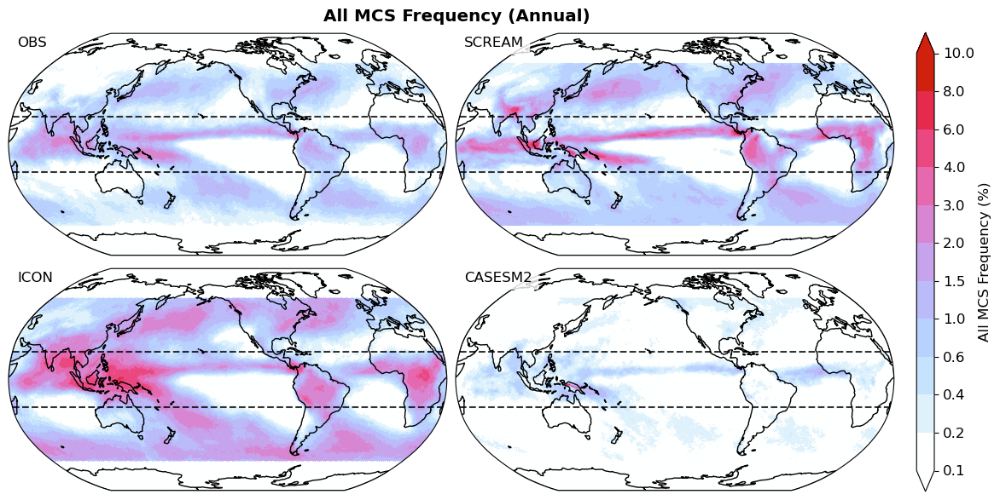

In [67]:
# Create 2D lists for data and titles
da_list = [
    [mcs_freq_all.sel(source='obs'), mcs_freq_all.sel(source='m1')],
    [mcs_freq_all.sel(source='m2'), mcs_freq_all.sel(source='m3')],
]
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
    [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
figwidth = 14
height_ratio_per_panel = 0.5
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
cb_fontsize = 10
wspace = 0.02
hspace = 0.05
varname1 = 'All MCS Frequency'
units = '%'
figtitle = 'All MCS Frequency (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
# levels = [0.1,0.5,1,2,3,5,7,10,13,16,20,25,30]
levels = [0.1,0.2,0.4,0.6,1,1.5,2,3,4,6,8,10]
min_thresh = None
colormaps = cmaps.cet_l_wcmr
cbticks = levels
oob_colors = None
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_mcs_all_freq_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, show_cb2=False, dpi=200)

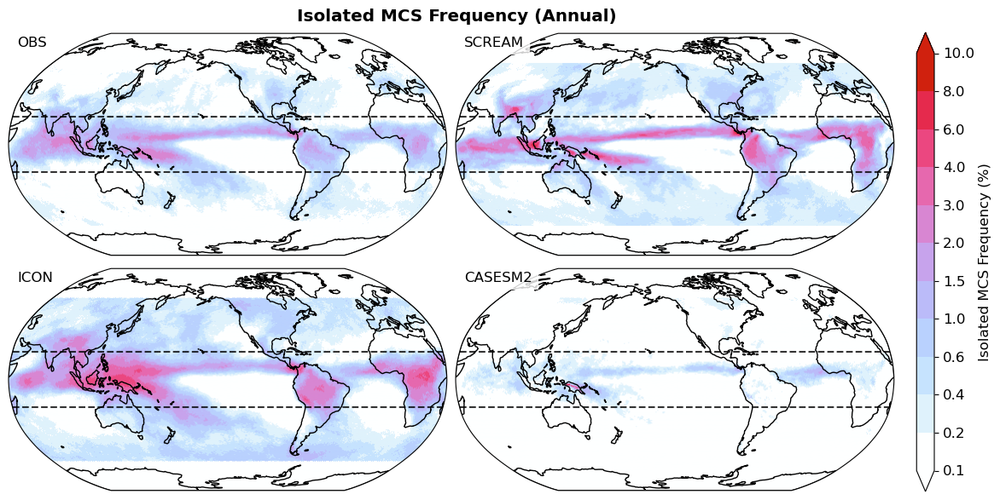

In [68]:
# Create 2D lists for data and titles
da_list = [
    [mcs_iso_freq_all.sel(source='obs'), mcs_iso_freq_all.sel(source='m1')],
    [mcs_iso_freq_all.sel(source='m2'), mcs_iso_freq_all.sel(source='m3')],
]
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
    [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
figwidth = 14
height_ratio_per_panel = 0.5
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
cb_fontsize = 10
wspace = 0.02
hspace = 0.05
varname1 = 'Isolated MCS Frequency'
units = '%'
figtitle = 'Isolated MCS Frequency (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
# levels = [0.1,0.5,1,2,3,5,7,10,13,16,20,25,30]
levels = [0.1,0.2,0.4,0.6,1,1.5,2,3,4,6,8,10]
min_thresh = None
colormaps = cmaps.cet_l_wcmr
cbticks = levels
oob_colors = None
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_mcs_iso_freq_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, show_cb2=False, dpi=200)

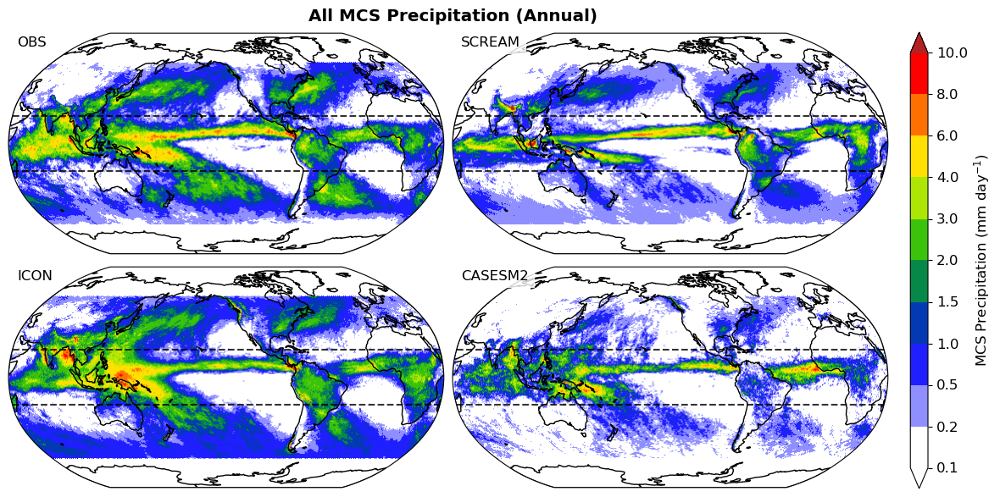

In [70]:
# Create 2D lists for data and titles
da_list = [
    [mcs_pcp_all.sel(source='obs'), mcs_pcp_all.sel(source='m1')],
    [mcs_pcp_all.sel(source='m2'), mcs_pcp_all.sel(source='m3')],
]
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
    [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
figwidth = 14
height_ratio_per_panel = 0.5
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
cb_fontsize = 10
wspace = 0.02
hspace = 0.05
varname1 = 'MCS Precipitation'
units = 'mm day$^{-1}$'
figtitle = 'All MCS Precipitation (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
levels = [0.1,0.2,0.5,1,1.5,2,3,4,6,8,10]
min_thresh = None
colormaps = cmaps.WhBlGrYeRe
cbticks = levels
oob_colors = {'over':'firebrick', 'under':'white'}
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_mcs_all_rain_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, show_cb2=False, dpi=200)

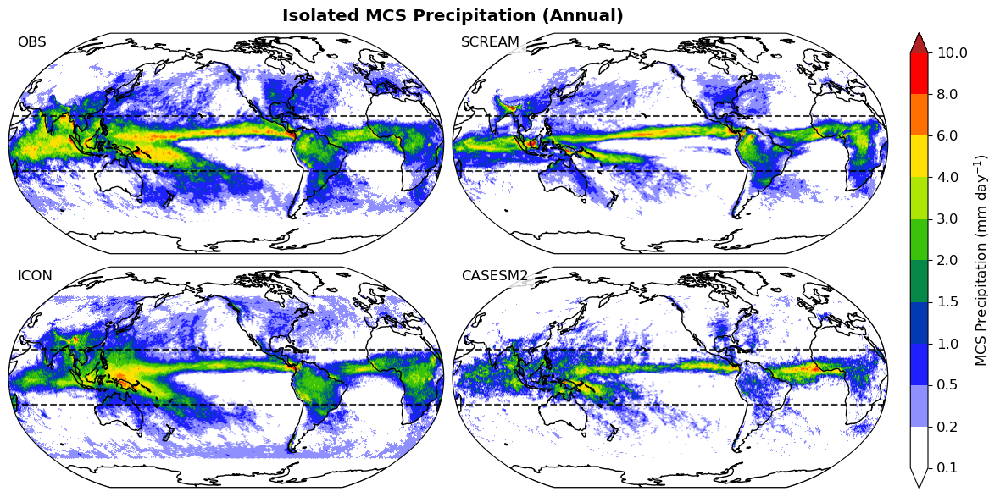

In [69]:
# Create 2D lists for data and titles
da_list = [
    [mcs_iso_pcp_all.sel(source='obs'), mcs_iso_pcp_all.sel(source='m1')],
    [mcs_iso_pcp_all.sel(source='m2'), mcs_iso_pcp_all.sel(source='m3')],
]
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
    [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
figwidth = 14
height_ratio_per_panel = 0.5
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
cb_fontsize = 10
wspace = 0.02
hspace = 0.05
varname1 = 'MCS Precipitation'
units = 'mm day$^{-1}$'
figtitle = 'Isolated MCS Precipitation (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
levels = [0.1,0.2,0.5,1,1.5,2,3,4,6,8,10]
min_thresh = None
colormaps = cmaps.WhBlGrYeRe
cbticks = levels
oob_colors = {'over':'firebrick', 'under':'white'}
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_mcs_iso_rain_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, show_cb2=False, dpi=200)

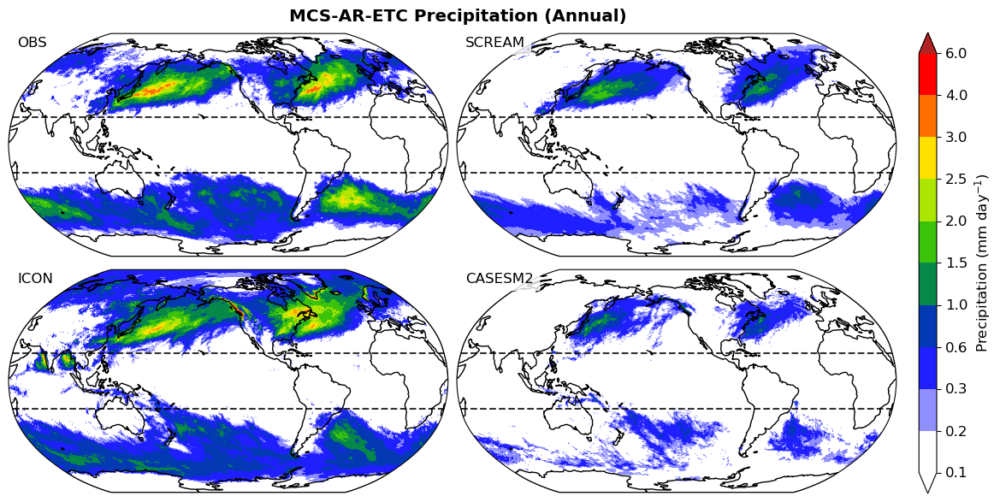

In [117]:
# Create 2D lists for data and titles
da_list = [
    [mcs_ar_etc_pcp_all.sel(source='obs'), mcs_ar_etc_pcp_all.sel(source='m1')],
    [mcs_ar_etc_pcp_all.sel(source='m2'), mcs_ar_etc_pcp_all.sel(source='m3')],
]
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
    [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
figwidth = 14
height_ratio_per_panel = 0.5
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
cb_fontsize = 10
wspace = 0.02
hspace = 0.05
varname1 = 'Precipitation'
units = 'mm day$^{-1}$'
figtitle = 'MCS-AR-ETC Precipitation (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
# levels = [0.1,0.2,0.5,1,1.5,2,3,4,6,8,10]
levels = [0.1,0.2,0.3,0.6,1,1.5,2,2.5,3,4,6]
min_thresh = None
colormaps = cmaps.WhBlGrYeRe
cbticks = levels
oob_colors = {'over':'firebrick', 'under':'white'}
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_mcs_ar_etc_rain_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, show_cb2=False, dpi=200)

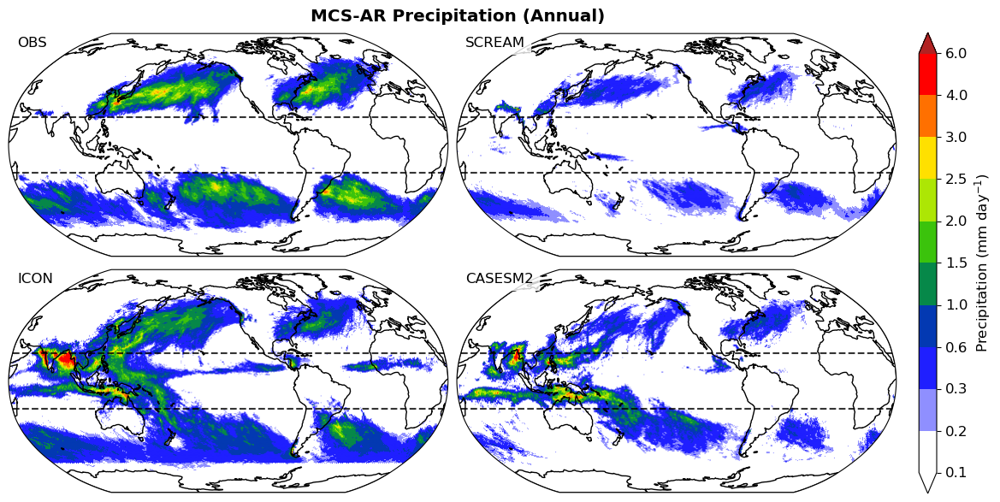

In [118]:
# Create 2D lists for data and titles
da_list = [
    [mcs_ar_pcp_all.sel(source='obs'), mcs_ar_pcp_all.sel(source='m1')],
    [mcs_ar_pcp_all.sel(source='m2'), mcs_ar_pcp_all.sel(source='m3')],
]
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
    [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
figwidth = 14
height_ratio_per_panel = 0.5
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
cb_fontsize = 10
wspace = 0.02
hspace = 0.05
varname1 = 'Precipitation'
units = 'mm day$^{-1}$'
figtitle = 'MCS-AR Precipitation (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
# levels = [0.1,0.2,0.5,1,1.5,2,3,4,6,8,10]
levels = [0.1,0.2,0.3,0.6,1,1.5,2,2.5,3,4,6]
min_thresh = None
colormaps = cmaps.WhBlGrYeRe
cbticks = levels
oob_colors = {'over':'firebrick', 'under':'white'}
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_mcs_ar_rain_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, show_cb2=False, dpi=200)

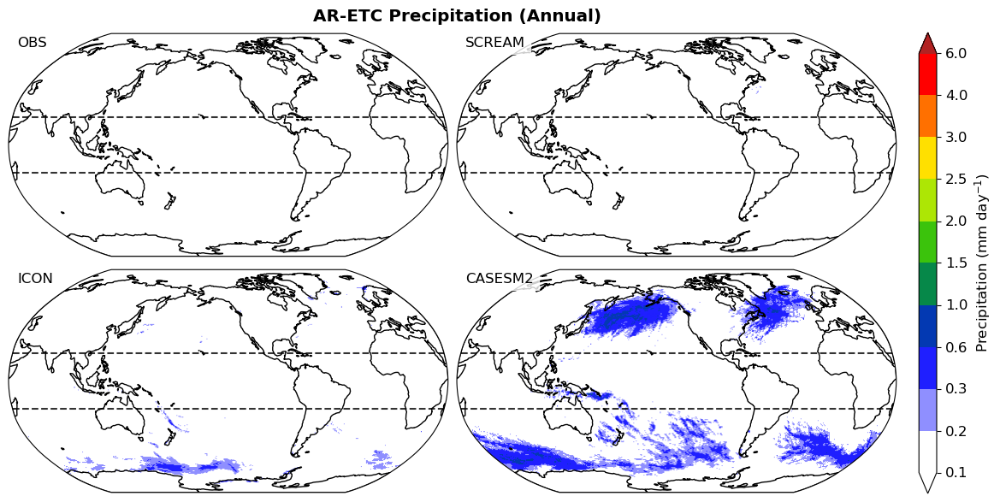

In [119]:
# Create 2D lists for data and titles
da_list = [
    [ar_etc_pcp_all.sel(source='obs'), ar_etc_pcp_all.sel(source='m1')],
    [ar_etc_pcp_all.sel(source='m2'), ar_etc_pcp_all.sel(source='m3')],
]
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
    [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
figwidth = 14
height_ratio_per_panel = 0.5
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
cb_fontsize = 10
wspace = 0.02
hspace = 0.05
varname1 = 'Precipitation'
units = 'mm day$^{-1}$'
figtitle = 'AR-ETC Precipitation (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
# levels = [0.1,0.2,0.5,1,1.5,2,3,4,6,8,10]
levels = [0.1,0.2,0.3,0.6,1,1.5,2,2.5,3,4,6]
min_thresh = None
colormaps = cmaps.WhBlGrYeRe
cbticks = levels
oob_colors = {'over':'firebrick', 'under':'white'}
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_ar_etc_rain_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, show_cb2=False, dpi=200)

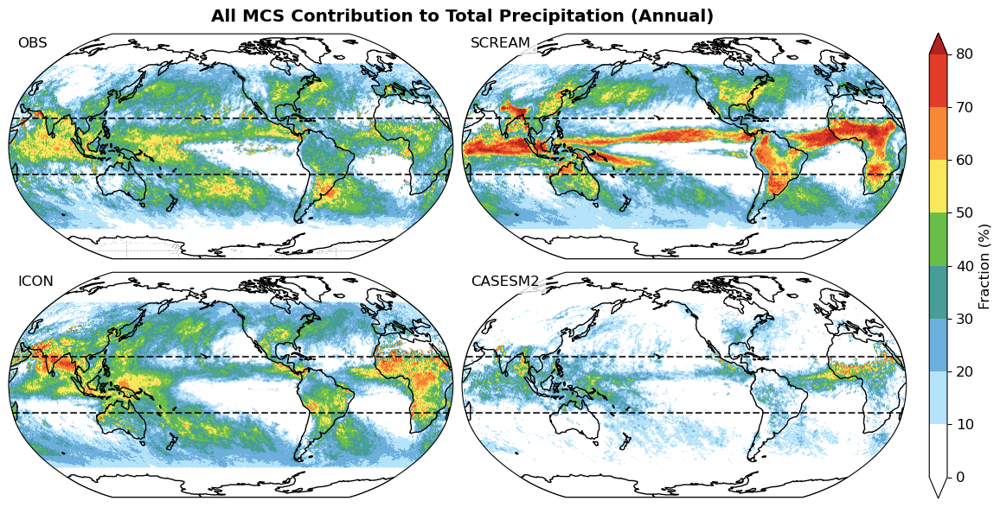

In [77]:
# Create 2D lists for data and titles
da_list = [
    [mcs_pcpfrac_all.sel(source='obs'), mcs_pcpfrac_all.sel(source='m1')],
    [mcs_pcpfrac_all.sel(source='m2'), mcs_pcpfrac_all.sel(source='m3')],
]
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
    [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
figwidth = 14
height_ratio_per_panel = 0.5
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
cb_fontsize = 10
wspace = 0.02
hspace = 0.05
varname1 = 'Fraction'
units = '%'
figtitle = 'All MCS Contribution to Total Precipitation (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
levels = np.arange(0, 81, 10)
min_thresh = None
colormaps = cmaps.WhiteBlueGreenYellowRed
colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
cbticks = levels
oob_colors = {'over':'firebrick', 'under':'white'}
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_mcs_all_rainfrac_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, show_cb2=False, dpi=200)

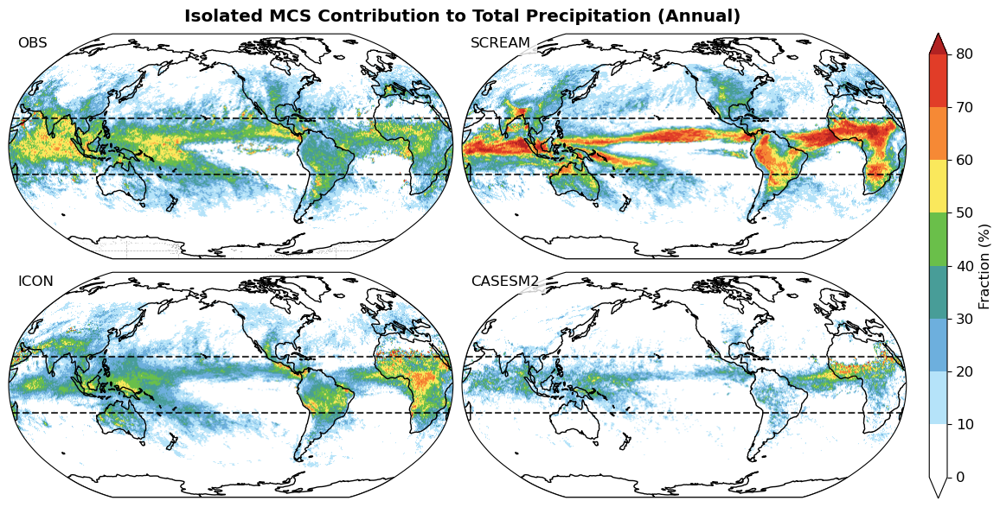

In [74]:
# Create 2D lists for data and titles
da_list = [
    [mcs_iso_pcpfrac_all.sel(source='obs'), mcs_iso_pcpfrac_all.sel(source='m1')],
    [mcs_iso_pcpfrac_all.sel(source='m2'), mcs_iso_pcpfrac_all.sel(source='m3')],
]
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
    [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
figwidth = 14
height_ratio_per_panel = 0.5
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
cb_fontsize = 10
wspace = 0.02
hspace = 0.05
varname1 = 'Fraction'
units = '%'
figtitle = 'Isolated MCS Contribution to Total Precipitation (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
levels = np.arange(0, 81, 10)
min_thresh = None
colormaps = cmaps.WhiteBlueGreenYellowRed
colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
cbticks = levels
oob_colors = {'over':'firebrick', 'under':'white'}
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_mcs_iso_rainfrac_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, show_cb2=False, dpi=200)

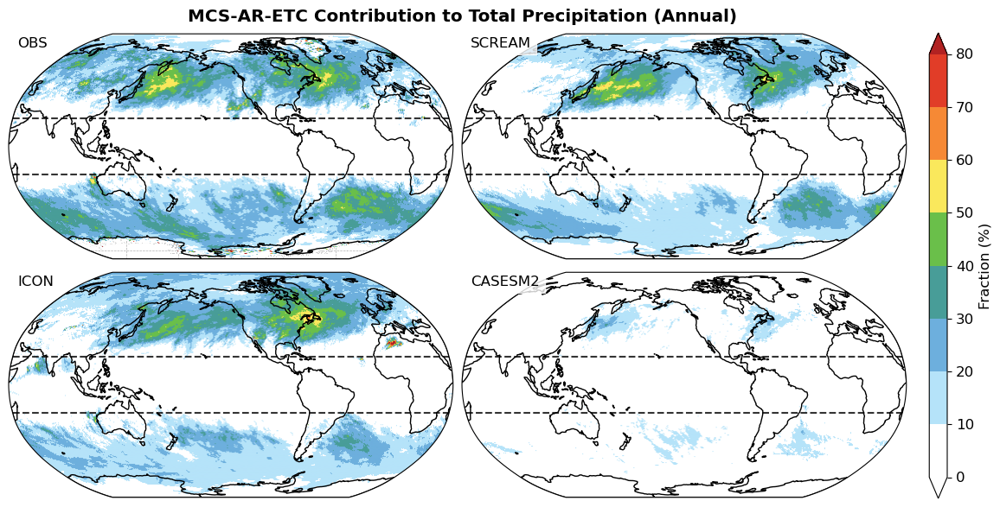

In [78]:
# Create 2D lists for data and titles
da_list = [
    [mcs_ar_etc_pcpfrac_all.sel(source='obs'), mcs_ar_etc_pcpfrac_all.sel(source='m1')],
    [mcs_ar_etc_pcpfrac_all.sel(source='m2'), mcs_ar_etc_pcpfrac_all.sel(source='m3')],
]
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
    [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
figwidth = 14
height_ratio_per_panel = 0.5
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
cb_fontsize = 10
wspace = 0.02
hspace = 0.05
varname1 = 'Fraction'
units = '%'
figtitle = 'MCS-AR-ETC Contribution to Total Precipitation (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
levels = np.arange(0, 81, 10)
min_thresh = None
colormaps = cmaps.WhiteBlueGreenYellowRed
colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
cbticks = levels
oob_colors = {'over':'firebrick', 'under':'white'}
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_mcs_ar_etc_rainfrac_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, show_cb2=False, dpi=200)

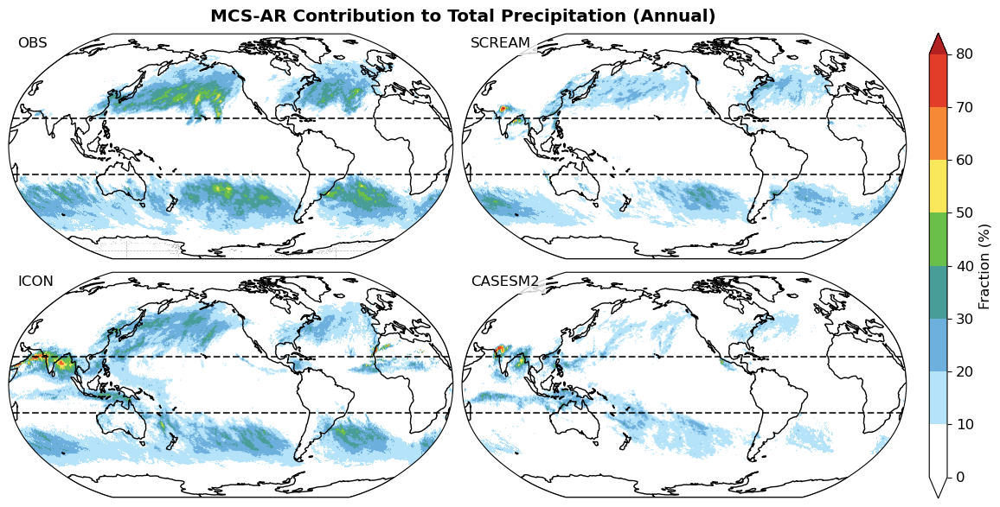

In [79]:
# Create 2D lists for data and titles
da_list = [
    [mcs_ar_pcpfrac_all.sel(source='obs'), mcs_ar_pcpfrac_all.sel(source='m1')],
    [mcs_ar_pcpfrac_all.sel(source='m2'), mcs_ar_pcpfrac_all.sel(source='m3')],
]
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
    [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
figwidth = 14
height_ratio_per_panel = 0.5
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
cb_fontsize = 10
wspace = 0.02
hspace = 0.05
varname1 = 'Fraction'
units = '%'
figtitle = 'MCS-AR Contribution to Total Precipitation (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
levels = np.arange(0, 81, 10)
min_thresh = None
colormaps = cmaps.WhiteBlueGreenYellowRed
colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
cbticks = levels
oob_colors = {'over':'firebrick', 'under':'white'}
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_mcs_ar_rainfrac_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, show_cb2=False, dpi=200)

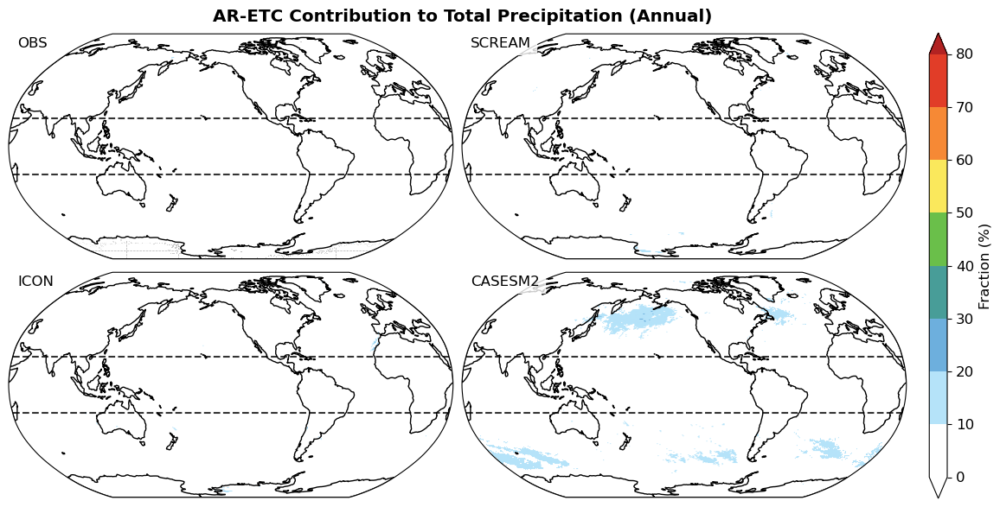

In [80]:
# Create 2D lists for data and titles
da_list = [
    [ar_etc_pcpfrac_all.sel(source='obs'), ar_etc_pcpfrac_all.sel(source='m1')],
    [ar_etc_pcpfrac_all.sel(source='m2'), ar_etc_pcpfrac_all.sel(source='m3')],
]
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
    [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
figwidth = 14
height_ratio_per_panel = 0.5
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
cb_fontsize = 10
wspace = 0.02
hspace = 0.05
varname1 = 'Fraction'
units = '%'
figtitle = 'AR-ETC Contribution to Total Precipitation (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
levels = np.arange(0, 81, 10)
min_thresh = None
colormaps = cmaps.WhiteBlueGreenYellowRed
colormaps = truncate_colormap(colormaps, minval=0.0, maxval=0.8)
cbticks = levels
oob_colors = {'over':'firebrick', 'under':'white'}
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_ar_etc_rainfrac_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, show_cb2=False, dpi=200)

## Function to plot difference maps

In [81]:
def plot_maps_obs_and_diffs(obs_data, model_data_list, titles, 
                           obs_levels, diff_levels, obs_colormap, diff_colormap, 
                           obs_cblabel, diff_cblabel, obs_cbticks, diff_cbticks, figname,
                           obs_oob_colors=None, diff_oob_colors=None,
                           min_thresh=None, wspace=None, hspace=None, 
                           figsize=None, fontsize=None, cb_fontsize=None, 
                           figtitle=None, dpi=200, lat_lines=None):
    """
    Plot OBS data in first panel and model differences (model - obs) in remaining panels.
    Two horizontal colorbars are placed below the plot grid.
    
    Parameters:
    -----------
    obs_data : xarray.DataArray
        Observational data for the first panel
    model_data_list : list
        List of model xarray.DataArrays for difference calculation
    titles : list
        List of titles for each panel (obs + models)
    obs_levels : list
        Color levels for observational data
    diff_levels : list
        Color levels for difference data
    obs_colormap : str
        Colormap name for observational data
    diff_colormap : str
        Colormap name for difference data
    obs_cblabel : str
        Label for observational colorbar
    diff_cblabel : str
        Label for difference colorbar
    obs_cbticks : list
        Tick values for observational colorbar
    diff_cbticks : list
        Tick values for difference colorbar
    figname : str
        Output filename
    obs_oob_colors : dict or None
        Out-of-bounds colors for observational data
    diff_oob_colors : dict or None
        Out-of-bounds colors for difference data
    min_thresh : float or None
        Minimum threshold for data display
    wspace : float or None
        Width space between subplots
    hspace : float or None
        Height space between subplots
    figtitle : str or None
        Title for the entire figure
    figsize : tuple or None
        Figure size (width, height) in inches
    fontsize : float or None
        Font size for text elements
    cb_fontsize : float or None
        Font size for colorbar text elements
    lat_lines : list or None
        List of latitude values to plot as horizontal lines
    """
    
    # Calculate grid dimensions
    total_panels = 1 + len(model_data_list)  # obs + models
    ncol = int(np.ceil(np.sqrt(total_panels)))
    nrow = int(np.ceil(total_panels / ncol))
    
    # Calculate difference data
    diff_data_list = []
    for model_data in model_data_list:
        diff_data = model_data - obs_data
        diff_data_list.append(diff_data)
    
    # Set up matplotlib parameters
    mpl.rcParams['font.size'] = fontsize
    proj = ccrs.Robinson(central_longitude=225)
    data_proj = ccrs.PlateCarree()
    resolution = '110m'
    land = cf.NaturalEarthFeature('physical', 'land', resolution)
    
    # Create figure with custom grid layout
    fig = plt.figure(figsize=figsize, dpi=100)
    
    # Main grid for maps (leave space for colorbars at bottom)
    gs_main = gridspec.GridSpec(2, 1, figure=fig, height_ratios=[1, 0.05], hspace=0.05)
    
    # Subplot grid for maps
    gs_maps = gridspec.GridSpecFromSubplotSpec(nrow, ncol, subplot_spec=gs_main[0], wspace=wspace, hspace=hspace)
    
    # Subplot grid for colorbars (2 columns for 2 colorbars)
    gs_cbar = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs_main[1], wspace=wspace, hspace=0)
    
    # Set up colormaps
    obs_cmap = copy.copy(mpl.colormaps.get_cmap(obs_colormap))
    diff_cmap = copy.copy(mpl.colormaps.get_cmap(diff_colormap))

    # Set out-of-bounds colors
    if obs_oob_colors is not None:
        oob_c = obs_oob_colors
        if oob_c is not None:
            obs_cmap.set_over(oob_c['over'])
            obs_cmap.set_under(oob_c['under'])
    if diff_oob_colors is not None:
        oob_c = diff_oob_colors
        if oob_c is not None:
            diff_cmap.set_over(oob_c['over'])
            diff_cmap.set_under(oob_c['under'])

    # Color normalizations
    obs_norm = colors.BoundaryNorm(boundaries=obs_levels, ncolors=obs_cmap.N)
    diff_norm = colors.BoundaryNorm(boundaries=diff_levels, ncolors=diff_cmap.N)
    
    # Variables to store plot objects for colorbars
    obs_plot = None
    diff_plot = None
    
    # Plot data panels
    panel_idx = 0
    
    # First panel: Observational data
    row = panel_idx // ncol
    col = panel_idx % ncol
    ax = plt.subplot(gs_maps[row, col], projection=proj)
    ax.set_global()
    ax.add_feature(land, facecolor='none', edgecolor='k', zorder=3)
    ax.set_aspect('auto', adjustable=None)
    
    # Add title
    ax.set_title(titles[0], fontsize=fontsize, loc='center')
    # flabel = ax.text(0.02, 0.94, titles[0], transform=ax.transAxes, fontsize=fontsize)
    # flabel.set_bbox(dict(facecolor='w', alpha=0.8, edgecolor='w'))
    
    # Add gridlines
    gl = ax.gridlines(crs=proj, draw_labels=False, linestyle='--', linewidth=0.5)
    
    # Apply minimum threshold if provided
    plot_data = obs_data
    if min_thresh is not None:
        plot_data = plot_data.where(plot_data > min_thresh)
    
    # Plot observational data
    obs_plot = egh.healpix_show(plot_data, ax=ax, cmap=obs_cmap, norm=obs_norm, zorder=2)
    
    # Add latitude lines if specified
    if lat_lines is not None:
        for lat in lat_lines:
            lons = np.linspace(-180, 180, 361)
            lats = np.full_like(lons, lat)
            ax.plot(lons, lats, color='k', linestyle='--', linewidth=1.5, 
                   transform=data_proj, zorder=4, alpha=0.8)
    
    panel_idx += 1
    
    # Remaining panels: Model differences
    for i, (diff_data, title) in enumerate(zip(diff_data_list, titles[1:])):
        row = panel_idx // ncol
        col = panel_idx % ncol
        ax = plt.subplot(gs_maps[row, col], projection=proj)
        ax.set_global()
        ax.add_feature(land, facecolor='none', edgecolor='k', zorder=3)
        ax.set_aspect('auto', adjustable=None)
        
        # Add title
        ax.set_title(title, fontsize=fontsize, loc='center')
        # flabel = ax.text(0.02, 0.94, title, transform=ax.transAxes, fontsize=fontsize)
        # flabel.set_bbox(dict(facecolor='w', alpha=0.8, edgecolor='w'))
        
        # Add gridlines
        gl = ax.gridlines(crs=proj, draw_labels=False, linestyle='--', linewidth=0.5)
        
        # Plot difference data
        diff_plot = egh.healpix_show(diff_data, ax=ax, cmap=diff_cmap, norm=diff_norm, zorder=2)
        
        # Add latitude lines if specified
        if lat_lines is not None:
            for lat in lat_lines:
                lons = np.linspace(-180, 180, 361)
                lats = np.full_like(lons, lat)
                ax.plot(lons, lats, color='k', linestyle='--', linewidth=1.5, 
                       transform=data_proj, zorder=4, alpha=0.8)
        
        panel_idx += 1
    
    # Hide empty subplots
    for idx in range(panel_idx, nrow * ncol):
        row = idx // ncol
        col = idx % ncol
        ax = plt.subplot(gs_maps[row, col])
        ax.set_visible(False)
    
    # Add horizontal colorbars
    if obs_plot is not None:
        cax_obs = plt.subplot(gs_cbar[0])
        cbar_obs = plt.colorbar(obs_plot, cax=cax_obs, label=obs_cblabel, 
                               ticks=obs_cbticks, orientation='horizontal', extend='both')
        cbar_obs.ax.tick_params(labelsize=cb_fontsize)
    
    if diff_plot is not None:
        cax_diff = plt.subplot(gs_cbar[1])
        cbar_diff = plt.colorbar(diff_plot, cax=cax_diff, label=diff_cblabel, 
                                ticks=diff_cbticks, orientation='horizontal', extend='both')
        cbar_diff.ax.tick_params(labelsize=cb_fontsize)
    
    # Add suptitle
    if figtitle:
        fig.suptitle(figtitle, y=0.95, fontweight='bold', fontsize=fontsize+2)
    
    # Save figure
    fig.savefig(figname, dpi=dpi, bbox_inches='tight', facecolor='w')
    return fig

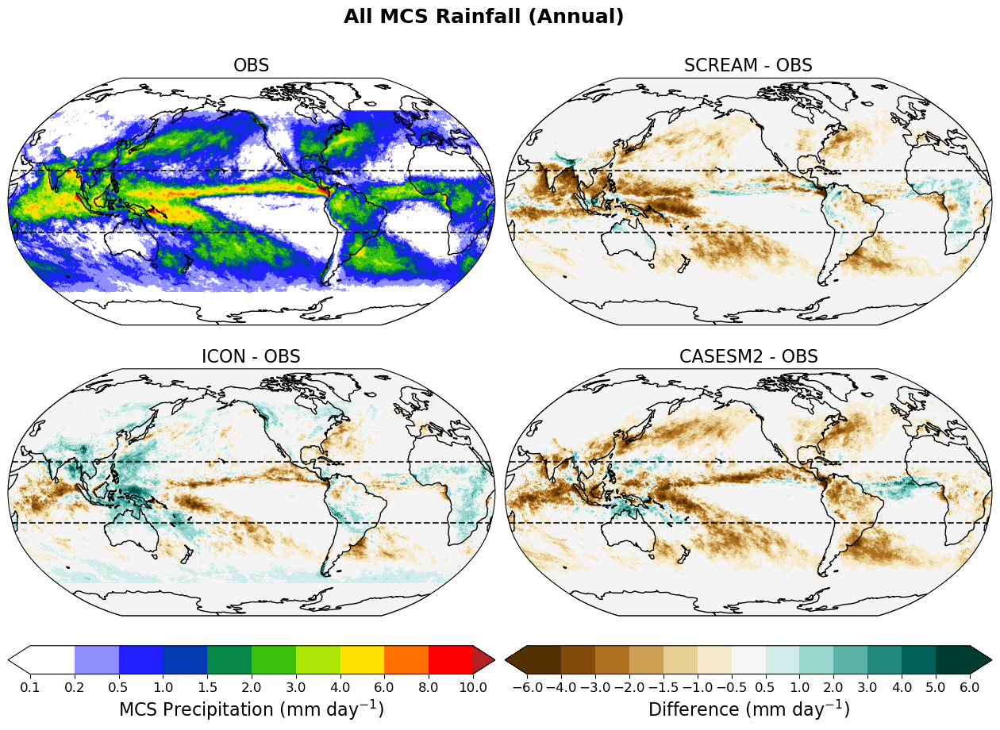

In [83]:
obs_data = mcs_pcp_all.sel(source='obs')
model_data_list = [
    mcs_pcp_all.sel(source='m1'),
    mcs_pcp_all.sel(source='m2'),
    mcs_pcp_all.sel(source='m3')
]

titles = [
    f"{name_map_plot['obs']}",
    f"{name_map_plot['m1']} - {name_map_plot['obs']}",
    f"{name_map_plot['m2']} - {name_map_plot['obs']}",
    f"{name_map_plot['m3']} - {name_map_plot['obs']}"
]

# Setup parameters
figwidth = 16
figheight = 10
figsize = [figwidth, figheight]
fontsize = 16
cb_fontsize = 12
wspace = 0.02
hspace = 0.05

# Observational data parameters
obs_levels = [0.1,0.2,0.5,1,1.5,2,3,4,6,8,10]
obs_colormap = cmaps.WhBlGrYeRe
obs_cbticks = obs_levels
obs_oob_colors = {'over':'firebrick', 'under':'white'}
obs_cblabel = 'MCS Precipitation (mm day$^{-1}$)'

# Difference data parameters
diff_levels = [-6,-4,-3,-2,-1.5,-1,-0.5,0.5,1,2,3,4,5,6]
diff_colormap = 'BrBG'
diff_oob_colors = None
diff_cbticks = diff_levels
diff_cblabel = 'Difference (mm day$^{-1}$)'

figname = f'{figdir}globalmap_mcs_all_rain_obs_vs_models_diff.png'
figtitle = 'All MCS Rainfall (Annual)'

# Plot figure
fig = plot_maps_obs_and_diffs(obs_data, model_data_list, titles,
                             obs_levels, diff_levels, obs_colormap, diff_colormap,
                             obs_cblabel, diff_cblabel, obs_cbticks, diff_cbticks, figname,
                             obs_oob_colors=obs_oob_colors, diff_oob_colors=diff_oob_colors,
                             min_thresh=None, wspace=wspace, hspace=hspace, figsize=figsize,
                             fontsize=fontsize, cb_fontsize=cb_fontsize, 
                             figtitle=figtitle, dpi=200, lat_lines=tropics_lat)

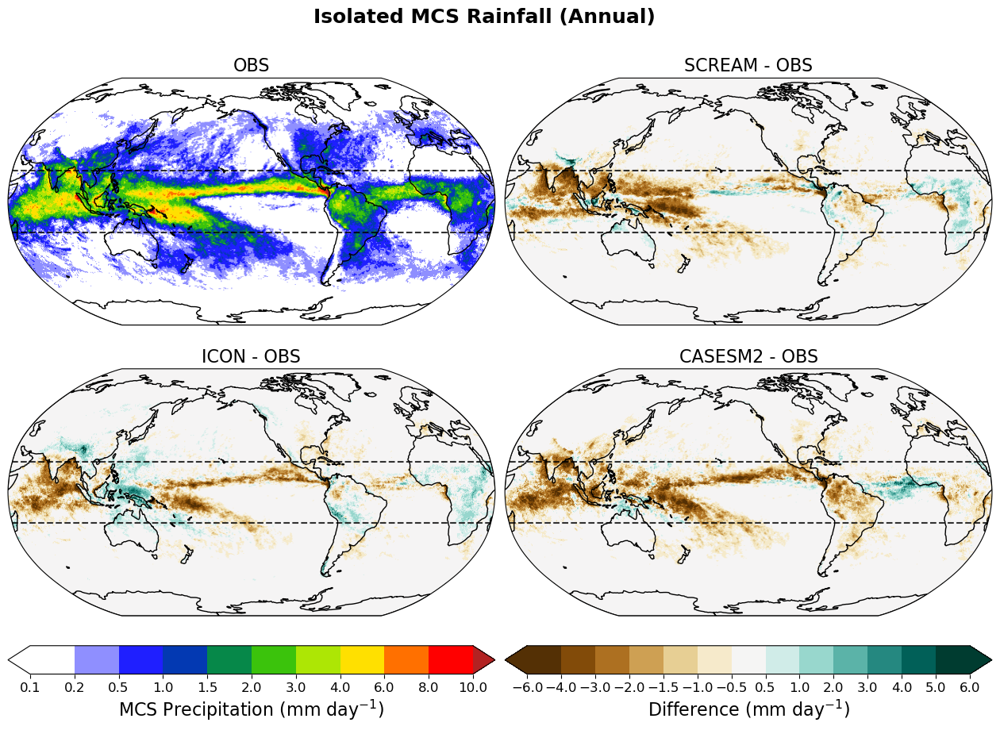

In [84]:
obs_data = mcs_iso_pcp_all.sel(source='obs')
model_data_list = [
    mcs_iso_pcp_all.sel(source='m1'),
    mcs_iso_pcp_all.sel(source='m2'),
    mcs_iso_pcp_all.sel(source='m3')
]

titles = [
    f"{name_map_plot['obs']}",
    f"{name_map_plot['m1']} - {name_map_plot['obs']}",
    f"{name_map_plot['m2']} - {name_map_plot['obs']}",
    f"{name_map_plot['m3']} - {name_map_plot['obs']}"
]

# Setup parameters
figwidth = 16
figheight = 10
figsize = [figwidth, figheight]
fontsize = 16
cb_fontsize = 12
wspace = 0.02
hspace = 0.05

# Observational data parameters
obs_levels = [0.1,0.2,0.5,1,1.5,2,3,4,6,8,10]
obs_colormap = cmaps.WhBlGrYeRe
obs_cbticks = obs_levels
obs_oob_colors = {'over':'firebrick', 'under':'white'}
obs_cblabel = 'MCS Precipitation (mm day$^{-1}$)'

# Difference data parameters
diff_levels = [-6,-4,-3,-2,-1.5,-1,-0.5,0.5,1,2,3,4,5,6]
diff_colormap = 'BrBG'
diff_oob_colors = None
diff_cbticks = diff_levels
diff_cblabel = 'Difference (mm day$^{-1}$)'

figname = f'{figdir}globalmap_mcs_iso_rain_obs_vs_models_diff.png'
figtitle = 'Isolated MCS Rainfall (Annual)'

# Plot figure
fig = plot_maps_obs_and_diffs(obs_data, model_data_list, titles,
                             obs_levels, diff_levels, obs_colormap, diff_colormap,
                             obs_cblabel, diff_cblabel, obs_cbticks, diff_cbticks, figname,
                             obs_oob_colors=obs_oob_colors, diff_oob_colors=diff_oob_colors,
                             min_thresh=None, wspace=wspace, hspace=hspace, figsize=figsize,
                             fontsize=fontsize, cb_fontsize=cb_fontsize, 
                             figtitle=figtitle, dpi=200, lat_lines=tropics_lat)

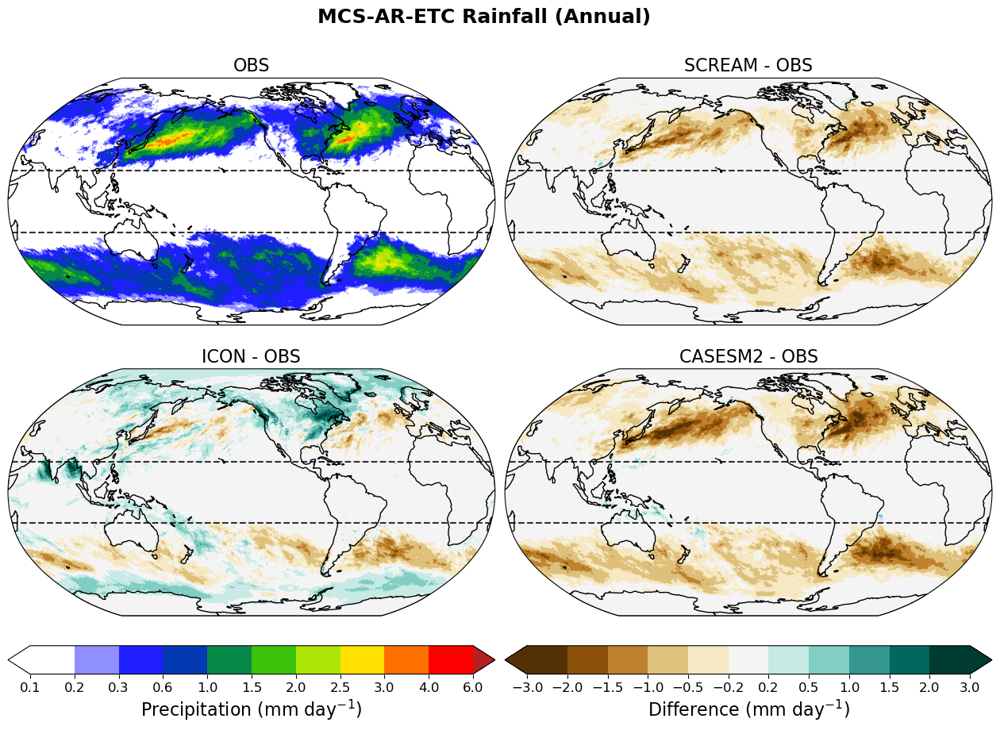

In [88]:
obs_data = mcs_ar_etc_pcp_all.sel(source='obs')
model_data_list = [
    mcs_ar_etc_pcp_all.sel(source='m1'),
    mcs_ar_etc_pcp_all.sel(source='m2'),
    mcs_ar_etc_pcp_all.sel(source='m3')
]

titles = [
    f"{name_map_plot['obs']}",
    f"{name_map_plot['m1']} - {name_map_plot['obs']}",
    f"{name_map_plot['m2']} - {name_map_plot['obs']}",
    f"{name_map_plot['m3']} - {name_map_plot['obs']}"
]

# Setup parameters
figwidth = 16
figheight = 10
figsize = [figwidth, figheight]
fontsize = 16
cb_fontsize = 12
wspace = 0.02
hspace = 0.05

# Observational data parameters
# obs_levels = [0.1,0.2,0.5,1,1.5,2,3,4,6,8,10]
obs_levels = [0.1,0.2,0.3,0.6,1,1.5,2,2.5,3,4,6]
obs_colormap = cmaps.WhBlGrYeRe
obs_cbticks = obs_levels
obs_oob_colors = {'over':'firebrick', 'under':'white'}
obs_cblabel = 'Precipitation (mm day$^{-1}$)'

# Difference data parameters
diff_levels = [-3,-2,-1.5,-1,-0.5,-0.2,0.2,0.5,1,1.5,2,3]
diff_colormap = 'BrBG'
diff_oob_colors = None
diff_cbticks = diff_levels
diff_cblabel = 'Difference (mm day$^{-1}$)'

figname = f'{figdir}globalmap_mcs_ar_etc_rain_obs_vs_models_diff.png'
figtitle = 'MCS-AR-ETC Rainfall (Annual)'

# Plot figure
fig = plot_maps_obs_and_diffs(obs_data, model_data_list, titles,
                             obs_levels, diff_levels, obs_colormap, diff_colormap,
                             obs_cblabel, diff_cblabel, obs_cbticks, diff_cbticks, figname,
                             obs_oob_colors=obs_oob_colors, diff_oob_colors=diff_oob_colors,
                             min_thresh=None, wspace=wspace, hspace=hspace, figsize=figsize,
                             fontsize=fontsize, cb_fontsize=cb_fontsize, 
                             figtitle=figtitle, dpi=200, lat_lines=tropics_lat)

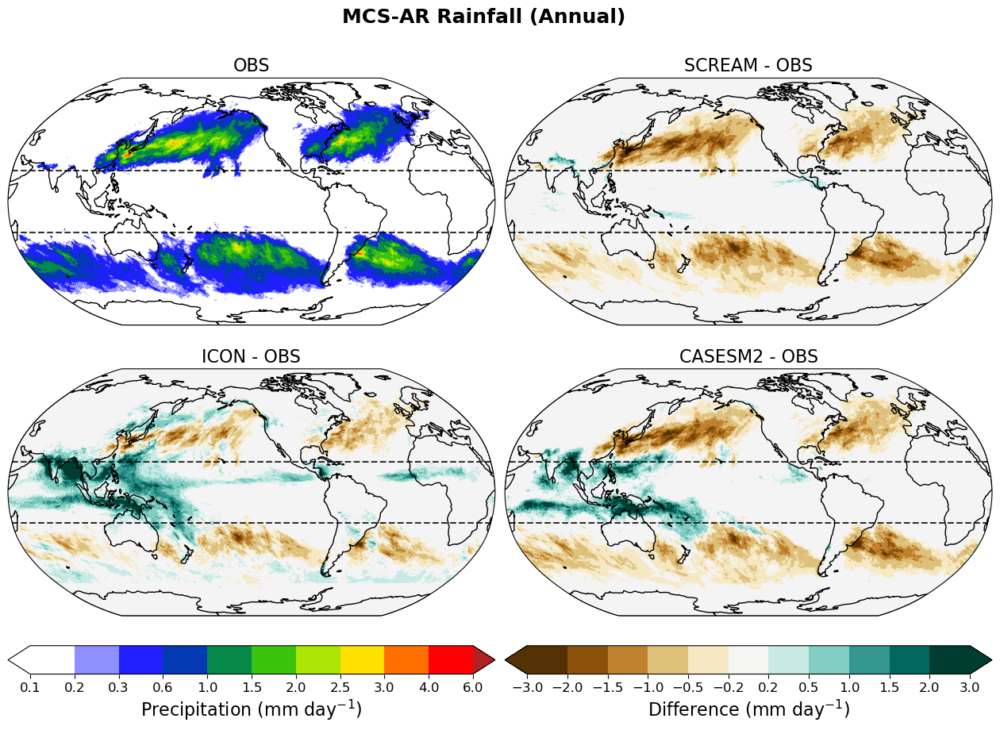

In [89]:
obs_data = mcs_ar_pcp_all.sel(source='obs')
model_data_list = [
    mcs_ar_pcp_all.sel(source='m1'),
    mcs_ar_pcp_all.sel(source='m2'),
    mcs_ar_pcp_all.sel(source='m3')
]

titles = [
    f"{name_map_plot['obs']}",
    f"{name_map_plot['m1']} - {name_map_plot['obs']}",
    f"{name_map_plot['m2']} - {name_map_plot['obs']}",
    f"{name_map_plot['m3']} - {name_map_plot['obs']}"
]

# Setup parameters
figwidth = 16
figheight = 10
figsize = [figwidth, figheight]
fontsize = 16
cb_fontsize = 12
wspace = 0.02
hspace = 0.05

# Observational data parameters
# obs_levels = [0.1,0.2,0.5,1,1.5,2,3,4,6,8,10]
obs_levels = [0.1,0.2,0.3,0.6,1,1.5,2,2.5,3,4,6]
obs_colormap = cmaps.WhBlGrYeRe
obs_cbticks = obs_levels
obs_oob_colors = {'over':'firebrick', 'under':'white'}
obs_cblabel = 'Precipitation (mm day$^{-1}$)'

# Difference data parameters
diff_levels = [-3,-2,-1.5,-1,-0.5,-0.2,0.2,0.5,1,1.5,2,3]
diff_colormap = 'BrBG'
diff_oob_colors = None
diff_cbticks = diff_levels
diff_cblabel = 'Difference (mm day$^{-1}$)'

figname = f'{figdir}globalmap_mcs_ar_rain_obs_vs_models_diff.png'
figtitle = 'MCS-AR Rainfall (Annual)'

# Plot figure
fig = plot_maps_obs_and_diffs(obs_data, model_data_list, titles,
                             obs_levels, diff_levels, obs_colormap, diff_colormap,
                             obs_cblabel, diff_cblabel, obs_cbticks, diff_cbticks, figname,
                             obs_oob_colors=obs_oob_colors, diff_oob_colors=diff_oob_colors,
                             min_thresh=None, wspace=wspace, hspace=hspace, figsize=figsize,
                             fontsize=fontsize, cb_fontsize=cb_fontsize, 
                             figtitle=figtitle, dpi=200, lat_lines=tropics_lat)